## Project goal

The aim of this project is to analyse and visualise the Scottish Index of Multiple Deprivation (SIMD) using a combination of pandas, geopandas, seaborn, matplotlib, QGIS and ArcGis Pro. The insights derived could be used by Scottish Government to help shape future resource allocation strategy.

Although I recently relocated to Kraków, Poland, I was born and raised in Dundee, Scotland so this study area has an added layer of personal interest.

### Scottish Index of Multiple Deprivation (SIMD)

The Scottish Index of Multiple Deprivation 2020 is the Scottish Government’s standard tool for identifying concentrations of deprivation in Scotland. SIMD is based
on work conducted by Oxford University in 1999. SIMD 2020 is the Scottish Government’s sixth edition since 2004.

SIMD is one of four deprivation indices that cover the whole of the UK. The Scottish index differs from the other indices in the UK by following a slightly different
methodology in constructing the overall index. The following are the key differences:

- SIMD is based on data zones which are smaller geographical units compared to the lower super output areas used in the other indices.
- The data sources are different for health, education, crime and housing domains.
- SIMD includes a specific domain on geographic access to services.

### Methodology

SIMD combines seven different domains, or aspects, of deprivation. These are:

- Income
- Employment
- Health
- Education, skills and training
- Geographic access to services
- Crime
- Housing

These domains are constructed using a number of indicators to form ranks for each domain. Each of the seven domain ranks are then combined to form the overall SIMD. There are 6,976 data zones in Scotland. Data zones are ranked from 1 being most deprived to 6,976 being least deprived. This provides a measure of relative deprivation at data zone level, therefore it tells you that one data zone is relatively more deprived than another, but not how much more deprived.

The methodology used to construct SIMD 2020 remains fundamentally the same as that used to construct the previous versions of SIMD in 2004, 2006, 2009, 2012 and 2016. It is based on the methodology developed by Oxford University to produce the Scottish Indices of Deprivation in 2003. The Scottish Government produced the first SIMD in-house in 2004. As the methodology used has remained broadly consistent in each subsequent update, these technical notes provide a summary of how the SIMD is constructed and details on the indicators included in each domain of SIMD 2020. Full details of the individual methods for creating the domains and overall index are described in the SIMD 2004 Technical Report.


### Constructing SIMD

SIMD 2020 is built up from a total of 33 indicators covering the seven domains. A list of the indicators included in each domain is provided below:

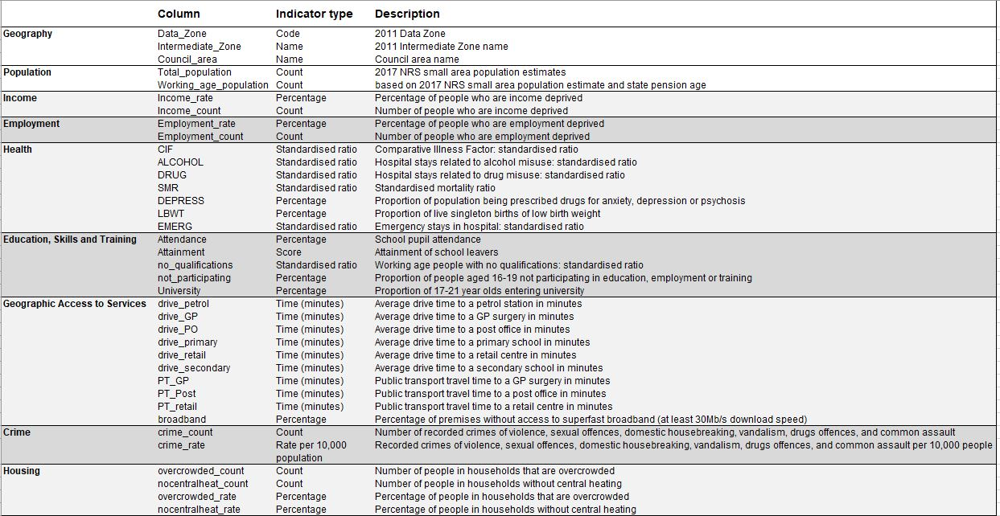

The indicators for each domain were selected on the basis that they are:

- domain-specific and appropriate for the purpose (as direct as possible measures for the given type of deprivation);
- up-to-date;
- capable of being updated on a regular basis;
- statistically robust;
- measure major features of a given type of deprivation (not conditions just experienced by a very small number of people or areas).

The domains are calculated differently depending on the type of data used in each one.

When comparing an index over time it is critical to ensure that the underlying methodology remains consistent from year to year as any changes will distort our analysis. From revoew of the detailed technical guidance the 2020 and 2016 indices share the same methodology. For both these years the granularity is 6976 ***data zones***. 

### Constructing the domains

The income, employment and housing domains are created by summing counts of people and dividing by the appropriate population denominator (taken form the NRS Small Area Population Estimates (SAPE) or Census). The crime domain and some indicators in the health and education domain also use SAPE.

The `income domain` is constructed by adding all five income indicators and dividing by the 2017 mid-year total population from SAPE. Thus, the domain score is a
simple percentage.

The `employment domain` is constructed by adding the three employment indicators and dividing by the 2017 mid-year working age population estimates taken from SAPE. The domain score is a simple percentage.

The `health, education and access domains` are created by ranking the indicators and transforming them to a standard normal distribution. This standardisation process is necessary because the indicators in these domains may be measured in different ways and on different scales. A statistical technique called factor analysis is then used to create a weight for each indicator. Next, the indicators are combined to produce a domain score which is then ranked.

The `crime domain` is a count of selected recorded crimes, divided by the 2017 midyear population estimates from SAPE. It is presented as the crime rate per 10,000
population.

The `housing domain` is the sum of the two housing indicators, divided by the total household population from the 2011 Census. The domain score is a simple percentage. 


### Calculating SIMD

Once the individual domain scores are calculated, they are combined to create the overall SIMD. The overall SIMD is a weighted sum of the seven domain scores, with
different domains given different weights. The weighting is based on the original research conducted by Oxford University, when the original Scottish Index of Multiple Deprivation was first produced, and takes into consideration how up to date and robust the indicators within each domain are.

The domain weighting used for SIMD 2020 remains the same as in SIMD16. A review of the weighting was undertaken when preparing for SIMD16 and concluded that the changes to data quality and methodology were not enough to justify a change of weightings.

The table below shows the percentage of overall SIMD 2020 for each of the seven
domains:

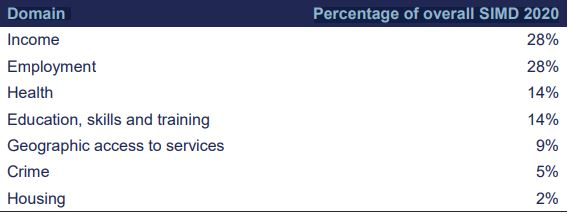

Prior to the weighting, the domains are standardised by ranking the scores. The ranks then undergo exponential transformation to avoid high ranks in one domain
cancelling out low ranks in another. The resulting scores for the overall SIMD are then ranked from 1 (most deprived) to 6,976 (least deprived) to create the final index.

The SIMD 2020 methodology is shown in the flow diagram below :

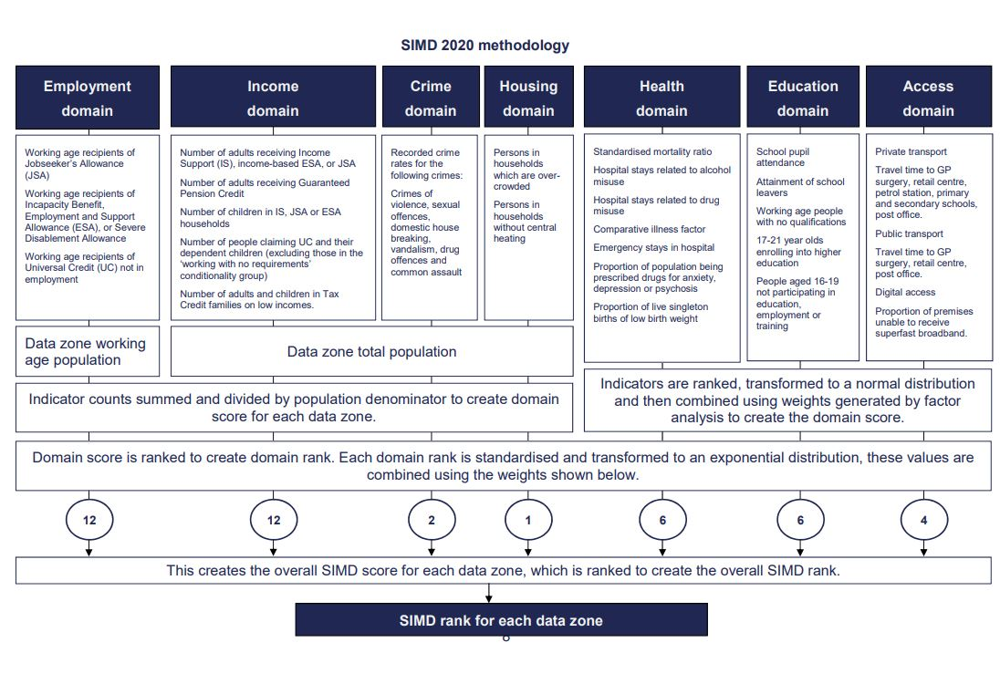

For the 2012 year, the granularity was 6,505 "data zones". In the interests of direct comparability, I have decided to limit the focus of my analysis to the 2016 and 2020 years.

Scotland comprises 32 Council Areas with further granularity provided by 6,976 **data zones** which are used for the purposes of the SIMD. Each data zone represents around 760 people.

https://www.gov.scot/publications/scottish-index-of-multiple-deprivation-rural-deprivation-evidence-review-and-case-studies/

### Data Providers

The following external organisations provided data for the construction of SIMD 2020:
- Department for Work and Pensions
- Her Majesty’s Revenue and Customs 
- National Records of Scotland
- NHS Scotland Information Services Division
- Scottish Qualifications Authority
- Higher Education Statistics Agency
- Skills Development Scotland
- Police Scotland
- Ofcom

### Getting the Data & Maps

The index was introduced in 2004 (and has evolved since then). An [interactive map](https://simd.scot/) is avaialable to explore and you can also download the data zone geospatial and indicator data.

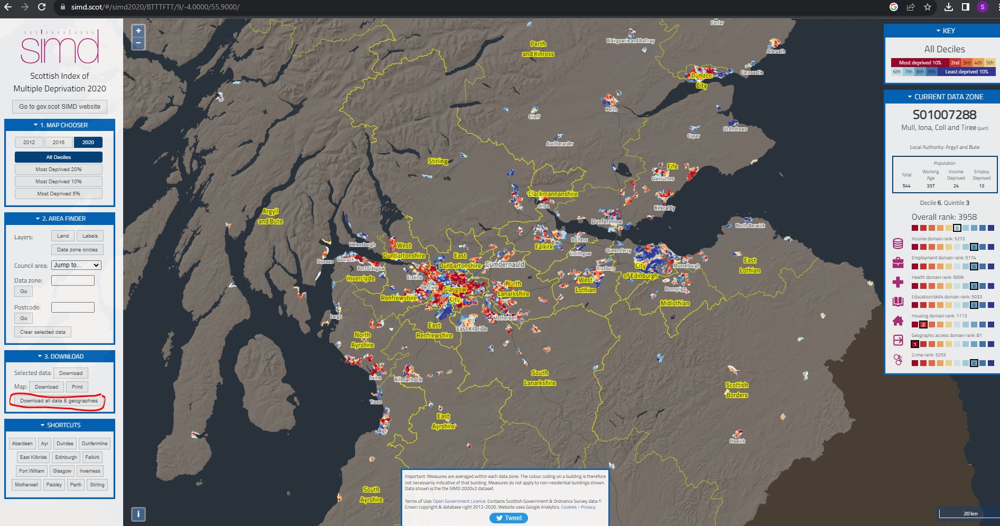

### Getting to know our data

In [1]:
!ls ./data

sc_dz_11.dbf  sc_dz_11.shp				simd2016_withinds.csv
sc_dz_11.prj  sc_dz_11.shx				simd2020_withinds.csv
sc_dz_11.qpj  simd2012_data_00410767_plusintervals.csv


Now that I have downloaded the data it is time to get my hands dirty! Data cleaning and exploration is a critical first step.

### Inport the required packages

In [2]:
import pandas as pd # data manipulation and analysis
import numpy as np # numerical and array-based operations
import geopandas as gpd  # manipulation, analysis, and visualization of geographic datasets
from shapely.geometry import Point
import matplotlib.pyplot as plt
import seaborn as sns

## SIMD - 2020

The SIMD rankings and individual indicators which contribute to the index are included in the `simd2020_withinds.csv` file which we can read in using pandas :

In [3]:
# read in our indicator data
simd_2020 = pd.read_csv('data/simd2020_withinds.csv')
simd_2020.head()

,Data_Zone,Intermediate_Zone,Council_area,Total_population,Working_Age_population,SIMD2020v2_Rank,SIMD_2020v2_Percentile,SIMD2020v2_Vigintile,SIMD2020v2_Decile,SIMD2020v2_Quintile,...,drive_petrol,drive_GP,drive_post,drive_primary,drive_retail,drive_secondary,PT_GP,PT_post,PT_retail,broadband
0,S01006506,Culter,Aberdeen City,894,580,4691,68,14,7,4,...,2.540103,3.074295,1.616239,2.615747,1.544260,9.930833,8.863589,5.856135,6.023406,11%
1,S01006507,Culter,Aberdeen City,793,470,4862,70,14,7,4,...,3.915072,4.309812,2.555858,3.646697,2.849656,11.042816,9.978272,7.515000,7.926029,1%
2,S01006508,Culter,Aberdeen City,624,461,5686,82,17,9,5,...,3.323025,3.784549,1.440991,3.247325,2.062255,10.616768,8.620700,4.321493,5.770910,1%
3,S01006509,Culter,Aberdeen City,537,307,4332,63,13,7,4,...,2.622991,2.778026,2.620681,1.936908,2.160142,10.036471,7.935112,8.433328,8.329819,11%
4,S01006510,Culter,Aberdeen City,663,415,3913,57,12,6,3,...,2.115004,2.358335,2.408416,1.845672,1.784635,9.650000,5.568964,6.966429,6.632609,0%


### A quick overview of our data

In [4]:
simd_2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6976 entries, 0 to 6975
Data columns (total 49 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Data_Zone                        6976 non-null   object 
 1   Intermediate_Zone                6976 non-null   object 
 2   Council_area                     6976 non-null   object 
 3   Total_population                 6976 non-null   int64  
 4   Working_Age_population           6976 non-null   int64  
 5   SIMD2020v2_Rank                  6976 non-null   int64  
 6   SIMD_2020v2_Percentile           6976 non-null   int64  
 7   SIMD2020v2_Vigintile             6976 non-null   int64  
 8   SIMD2020v2_Decile                6976 non-null   int64  
 9   SIMD2020v2_Quintile              6976 non-null   int64  
 10  SIMD2020v2_Income_Domain_Rank    6976 non-null   float64
 11  SIMD2020_Employment_Domain_Rank  6976 non-null   float64
 12  SIMD2020_Health_Doma

So we have 6976 observations (rows), one for each data zone, and 49 features/indicators (columns).

### Data Types

Understanding the type of data that we have from the outset is crucial if we want to avoid headaches later. The data types for each column are included above and an explanation of each is provided below:

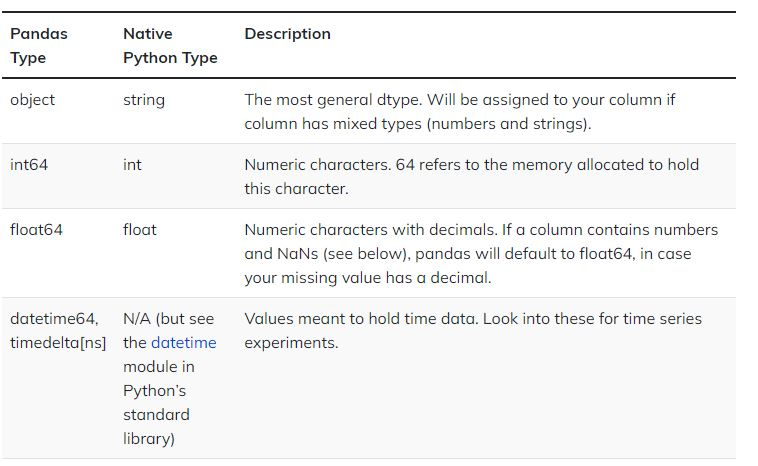

### Missing Data and Quality issues

Let's check to see if there is any missing data:

In [5]:
nan_2020 = simd_2020.isna().sum().sort_values(ascending=False)
nan_2020

Attainment                         11
CIF                                 3
not_participating                   3
SMR                                 2
University                          2
Attendance                          2
EMERG                               2
DRUG                                2
ALCOHOL                             2
broadband                           2
crime_rate                          1
LBWT                                1
DEPRESS                             1
SIMD2020v2_Income_Domain_Rank       0
Total_population                    0
crime_count                         0
overcrowded_count                   0
nocentralheating_count              0
overcrowded_rate                    0
nocentralheating_rate               0
drive_petrol                        0
drive_GP                            0
drive_post                          0
drive_primary                       0
drive_retail                        0
drive_secondary                     0
PT_GP       

In [6]:
number_nan_2020 = nan_2020.sum()
print(f'Our 2020 dataset contains {number_nan_2020} NaN values.')

Our 2020 dataset contains 34 NaN values.


### Review the Technical Report for Data Quality info

#### Income domain

The population estimate for a few data zones was zero in 2017, therefore a rate could not be determined. This is denoted by ‘*’.

#### Employment domain

The population estimate for a few data zones was zero in 2017,therefore a rate could not be determined. This is denoted by ‘*’. 

#### Health domain

After calculating the standardisation there are cases where division by zero occurs due to population estimate of data zone being zero. Such cases are marked "*". 

#### Education, skills and training domain

For some indicators, the population of the considered age group was zero in some data zones during the time period considered, and indicator rates and ranks could not be determined. Missing rates and ranks are denoted by ‘*’. To calculate the overall rankings for the education domain, the normalised scores for these data zones were set to zero before combining the indicators. As a result, the indicators with missing values moved the overall domain ranking of these data zones
towards a middle ranking. 

#### Geographic access to services domain

Drive times have been imputed to 190 minutes for at least some output areas in each of the following eleven data zones (for one or more services) as there was either
no car ferry connection within the time window considered, or the journey was longer than the maximum journey time of 180 minutes:

- S01007284 Mull, Iona, Coll and Tiree (retail centre,secondary school)
- S01007287 Mull, Iona, Coll and Tiree (GP, retail centre,petrol station, secondary school)
- S01007289 Oban South (all services)
- S01007310 Loch Awe – 03 (all services)
- S01007324 Whisky Isles (retail centre, secondary school)
- S01010504 Lochaber West (GP, retail centre, petrol station, secondary school)
- S01010506 Lochaber West (GP, retail centre, petrol station, secondary school)
- S01011831 Isles (Orkney) (retail centre, petrol station, primary school, secondary school)
- S01011832 Isles (Orkney) (retail centre, secondary school)
- S01012387 Shetland South (GP, retail centre, petrol station, secondary school)
- S01012416 North and East Isles (Shetland) (GP, retail centre, petrol station, primary school, secondary school) 

#### Crime domain

In a small number of data zones, the population was zero in the year considered, and crime rates could not be determined. Missing rates are denoted by ‘*’. 

### Data Cleansing

So, we can see that there are some `*` values. This is likely to cause problems so we will need to deal with these. Let's locate them :

`*` values

In [7]:
# Check for columns containing '*'
columns_with_asterisk_2020 = simd_2020.columns[simd_2020.eq('*').any()]

# Print the columns containing '*'
print(columns_with_asterisk_2020)

Index(['Attendance', 'Attainment', 'crime_count', 'crime_rate'], dtype='object')


And replace them with NaN :

In [8]:
simd_2020 = simd_2020.replace('*', np.nan)

In [9]:
number_nan_2020 = simd_2020.isna().sum().sort_values(ascending=False)
updated_number_nan_2020 = number_nan_2020.sum()

In [10]:
print(f'Our updated 2020 dataset contains {updated_number_nan_2020} NaN values.')

Our updated 2020 dataset contains 1777 NaN values.


In [11]:
simd_2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6976 entries, 0 to 6975
Data columns (total 49 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Data_Zone                        6976 non-null   object 
 1   Intermediate_Zone                6976 non-null   object 
 2   Council_area                     6976 non-null   object 
 3   Total_population                 6976 non-null   int64  
 4   Working_Age_population           6976 non-null   int64  
 5   SIMD2020v2_Rank                  6976 non-null   int64  
 6   SIMD_2020v2_Percentile           6976 non-null   int64  
 7   SIMD2020v2_Vigintile             6976 non-null   int64  
 8   SIMD2020v2_Decile                6976 non-null   int64  
 9   SIMD2020v2_Quintile              6976 non-null   int64  
 10  SIMD2020v2_Income_Domain_Rank    6976 non-null   float64
 11  SIMD2020_Employment_Domain_Rank  6976 non-null   float64
 12  SIMD2020_Health_Doma

We have some columns with essentially numerical information but held in string format. From review of the indicator table the columns `income_rate`, `employment_rate`, `DEPRESS`, `LBWT`, `Attendance`, `not_participating`, `University`, `broadband`, `overcrowded_rate` and `nocentralheat_rate` represent a percentage. 

`Attainment` is a score.

`crime_count` is a count.\
`crime_rate` is a rate.

Let's convert these columns to more appropriate data types.

The percentage strings include a `%` symbol at the end. Let's first confirm the offending columns : 

In [12]:
# Find columns containing '%' in their values
columns_with_percentage_values_2020 = simd_2020.applymap(lambda x: '%' in str(x)).any()

# Print the columns containing '%' in their values
print(columns_with_percentage_values_2020[columns_with_percentage_values_2020].index)

Index(['income_rate', 'employment_rate', 'DEPRESS', 'LBWT', 'Attendance',
       'not_participating', 'University', 'overcrowded_rate',
       'nocentralheating_rate', 'broadband'],
      dtype='object')


And then remove the `%` from those strings :

In [13]:
# Remove '%' from strings containing it
simd_2020 = simd_2020.applymap(lambda x: str(x).replace('%', '') if '%' in str(x) else x)
simd_2020.head()

,Data_Zone,Intermediate_Zone,Council_area,Total_population,Working_Age_population,SIMD2020v2_Rank,SIMD_2020v2_Percentile,SIMD2020v2_Vigintile,SIMD2020v2_Decile,SIMD2020v2_Quintile,...,drive_petrol,drive_GP,drive_post,drive_primary,drive_retail,drive_secondary,PT_GP,PT_post,PT_retail,broadband
0,S01006506,Culter,Aberdeen City,894,580,4691,68,14,7,4,...,2.540103,3.074295,1.616239,2.615747,1.544260,9.930833,8.863589,5.856135,6.023406,11
1,S01006507,Culter,Aberdeen City,793,470,4862,70,14,7,4,...,3.915072,4.309812,2.555858,3.646697,2.849656,11.042816,9.978272,7.515000,7.926029,1
2,S01006508,Culter,Aberdeen City,624,461,5686,82,17,9,5,...,3.323025,3.784549,1.440991,3.247325,2.062255,10.616768,8.620700,4.321493,5.770910,1
3,S01006509,Culter,Aberdeen City,537,307,4332,63,13,7,4,...,2.622991,2.778026,2.620681,1.936908,2.160142,10.036471,7.935112,8.433328,8.329819,11
4,S01006510,Culter,Aberdeen City,663,415,3913,57,12,6,3,...,2.115004,2.358335,2.408416,1.845672,1.784635,9.650000,5.568964,6.966429,6.632609,0


>If you have a column of values in a Pandas DataFrame that are stored as strings but represent floating-point numbers, you can convert that entire column to float values using the `pd.to_numeric()` function with the `errors='coerce'` parameter. This function will attempt to convert the values to numeric format, and if it encounters any invalid values, it will replace them with NaN (Not-a-Number). Here's how you can do it:

In [14]:
# List of column names to convert to float
columns_to_convert_2020 = ['income_rate', 'employment_rate', 'DEPRESS', 'LBWT', 'Attendance', 'Attainment', 'not_participating', 'University', 'crime_count', 'crime_rate', 'overcrowded_rate', 'nocentralheating_rate','broadband']

# Use astype to convert the specified columns to float
simd_2020[columns_to_convert_2020] = simd_2020[columns_to_convert_2020].apply(pd.to_numeric, errors='coerce')                              

In [15]:
simd_2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6976 entries, 0 to 6975
Data columns (total 49 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Data_Zone                        6976 non-null   object 
 1   Intermediate_Zone                6976 non-null   object 
 2   Council_area                     6976 non-null   object 
 3   Total_population                 6976 non-null   int64  
 4   Working_Age_population           6976 non-null   int64  
 5   SIMD2020v2_Rank                  6976 non-null   int64  
 6   SIMD_2020v2_Percentile           6976 non-null   int64  
 7   SIMD2020v2_Vigintile             6976 non-null   int64  
 8   SIMD2020v2_Decile                6976 non-null   int64  
 9   SIMD2020v2_Quintile              6976 non-null   int64  
 10  SIMD2020v2_Income_Domain_Rank    6976 non-null   float64
 11  SIMD2020_Employment_Domain_Rank  6976 non-null   float64
 12  SIMD2020_Health_Doma

### Most and least deprived datazones - 2020

Let's find out which datazone is the most and least deprived using the powerful pandas `.loc` :

In [16]:
most_deprivation = simd_2020.SIMD2020v2_Rank.min()
dz_most_deprivation = simd_2020.loc[simd_2020['SIMD2020v2_Rank'] == most_deprivation, 'Data_Zone'].values[0]
dz_name_most_deprivation = simd_2020.loc[simd_2020['SIMD2020v2_Rank'] == most_deprivation, 'Intermediate_Zone'].values[0]

In [17]:
print(f"The most deprived data zone in 2020 was: {dz_most_deprivation}, {dz_name_most_deprivation}.")

The most deprived data zone in 2020 was: S01010891, Greenock Town Centre and East Central.


In [18]:
least_deprivation = simd_2020.SIMD2020v2_Rank.max()
dz_least_deprivation = simd_2020.loc[simd_2020['SIMD2020v2_Rank'] == least_deprivation, 'Data_Zone'].values[0]
dz_name_least_deprivation = simd_2020.loc[simd_2020['SIMD2020v2_Rank'] == least_deprivation, 'Intermediate_Zone'].values[0]

In [19]:
print(f"The least deprived data zone in 2020 was: {dz_least_deprivation}, {dz_name_least_deprivation}.")

The least deprived data zone in 2020 was: S01008861, Stockbridge.


### Visualizations - Histograms, Boxplots, Scatterplots

Let's add some basic visualizations to geta quick picture of the spread of some of our data using histograms and boxplots using the `seaborn` library : 

#### Total Population of Data Zones

In [20]:
simd_2020.Total_population.describe()

count    6976.000000
mean      777.637615
std       219.108923
min         0.000000
25%       635.000000
50%       755.000000
75%       886.000000
max      3847.000000
Name: Total_population, dtype: float64

<AxesSubplot: xlabel='Total_population', ylabel='Count'>

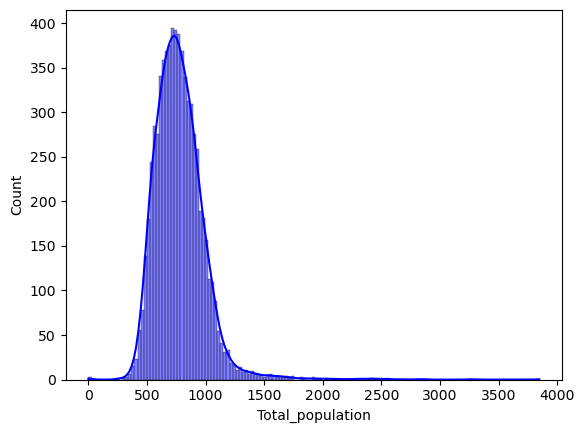

In [21]:
sns.histplot(data=simd_2020['Total_population'], kde=True, color='blue')

Text(0.5, 1.0, 'Boxplot of Data Zone populations')

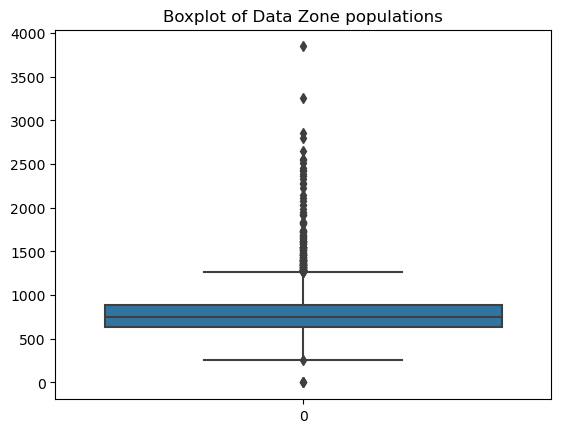

In [21]:
sns.boxplot(data=simd_2020['Total_population'])
# Add a title to your plot
plt.title("Boxplot of Data Zone populations")

As we can see the population of the datazones is generally centred around 750 but there some very low (zero) and very high (3,847) values.

#### Working Age Population of Data Zones

In [22]:
simd_2020.Working_Age_population.describe()

count    6976.000000
mean      500.973481
std       175.075939
min         0.000000
25%       395.000000
50%       475.000000
75%       568.000000
max      3423.000000
Name: Working_Age_population, dtype: float64

<AxesSubplot: xlabel='Working_Age_population', ylabel='Count'>

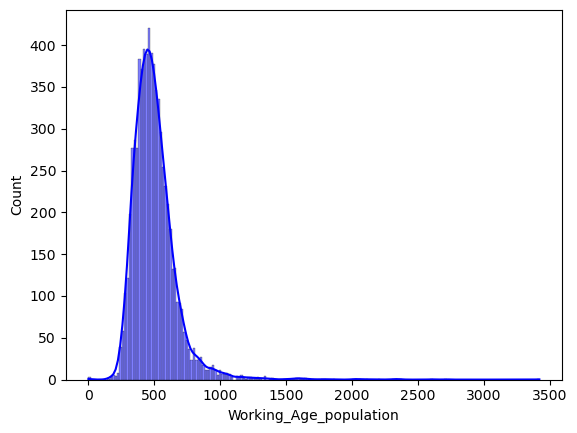

In [23]:
sns.histplot(data=simd_2020['Working_Age_population'], kde=True, color='blue')

Text(0.5, 1.0, 'Boxplot of Data Zone working age populations')

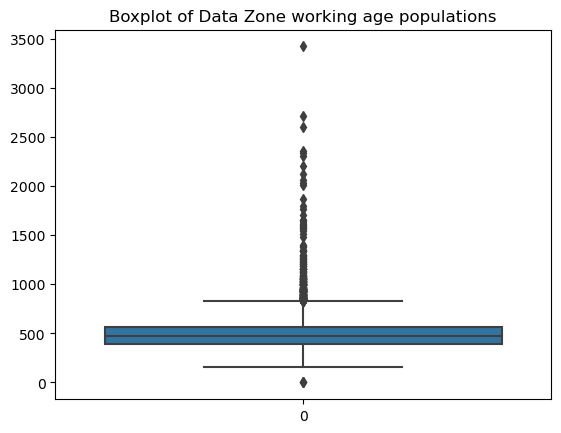

In [24]:
sns.boxplot(data=simd_2020['Working_Age_population'])
# Add a title to your plot
plt.title("Boxplot of Data Zone working age populations")

As we can see the working population of the datazones is generally centred around 500 but there some very low (zero) and very high (3,423) values.

### Relationship between different indicators 

We can also explore the inter-relationships between variables using scatterplots - e.g. is there any relationship between no qualifications and employmemt deprivation?

<AxesSubplot: xlabel='no_qualifications', ylabel='employment_count'>

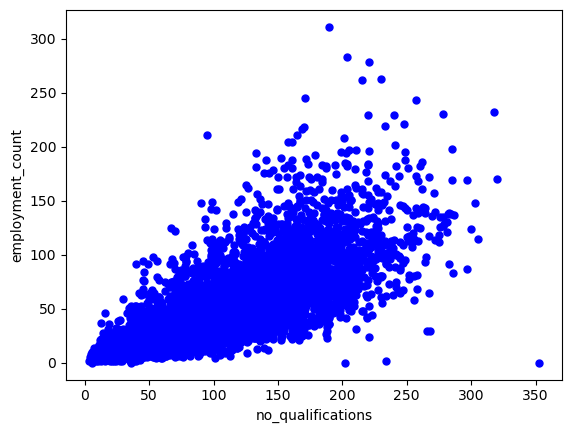

In [25]:
# Create a scatterplot
simd_2020.plot.scatter(x='no_qualifications', y='employment_count', c='blue', marker='o', s=25)

As one might expect there is a general positive trend, although not very strong. Generally, although there are clearly outliers, data zones which have a high number of people with no qualifications tend to also have a high number of people who are considered employment deprived.

### Adding a geospatial dimension to our non-spatial indicator data

Whilst we were able to readily obtain some useful insights using histograms, boxplots and scatterplots, let's harness the geospatial element of our data and visualize it using a map, which is a powerful and persuasive medium,  particularly for highlighting *where* to allocate resources, which is a key task of government.

Adding geospatial data in the form of a map adds a further layer of understanding.

### Data Zone Polygons

We have a `sc_dz_11.shp` file which contains the geometry of the `Data Zones`. This is of little value on its own but we can reveal powerful insights by combiming this with the indicator data that we have just cleaned up`simd_2020`.

We can get the datazones info using GeoPandas - we simply read in the file which creates a GeoPandas DataFrame :

In [26]:
datazones = gpd.read_file('data/sc_dz_11.shp')
datazones.head()

,DataZone,Name,TotPop2011,ResPop2011,HHCnt2011,StdAreaHa,StdAreaKm2,Shape_Leng,Shape_Area,geometry
0,S01006506,Culter - 01,872,852,424,438.880218,4.388801,11801.872345,4.388802e+06,"POLYGON ((-2.27748 57.09527, -2.27644 57.09521..."
1,S01006507,Culter - 02,836,836,364,22.349739,0.223498,2900.406362,2.217468e+05,"POLYGON ((-2.27354 57.10449, -2.27333 57.10449..."
2,S01006508,Culter - 03,643,643,340,27.019476,0.270194,3468.761949,2.701948e+05,"POLYGON ((-2.27443 57.10171, -2.27237 57.10046..."
3,S01006509,Culter - 04,580,580,274,9.625426,0.096254,1647.461389,9.625426e+04,"POLYGON ((-2.26611 57.10133, -2.26599 57.10092..."
4,S01006510,Culter - 05,644,577,256,18.007657,0.180076,3026.111412,1.800766e+05,"POLYGON ((-2.26013 57.10160, -2.26050 57.10134..."


In [27]:
type(datazones)

geopandas.geodataframe.GeoDataFrame

We can get a very quick plot of our map :

<AxesSubplot: >

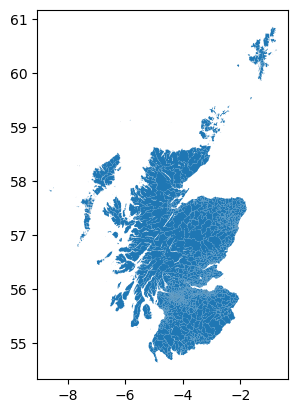

In [28]:
datazones.plot()

I think I recognise that country!

### QGIS

`QGIS`, which stands for Quantum Geographic Information System, is an open-source geographic information system (GIS) software that allows users to create, edit, analyze, visualize, and manage geographic and spatial data. Here's a brief overview of QGIS:

`Open Source:`
QGIS is open-source software, which means it is freely available to anyone, and its source code can be modified and extended by the community of users and developers. This makes it a cost-effective option for working with spatial data.

`Cross-Platform:`
QGIS is a cross-platform application, meaning it is available for various operating systems, including Windows, macOS, and Linux. This allows users to work with GIS data on their preferred platform.

`User-Friendly Interface:`
QGIS features an intuitive and user-friendly graphical interface that is accessible to both beginners and experienced GIS professionals. It provides a wide range of tools and functionalities for spatial data management and analysis.

`Data Formats:`
QGIS supports a vast array of spatial data formats, including shapefiles, GeoTIFF, PostGIS, and more. It can import and export data in various formats, making it compatible with many GIS datasets.

`Data Visualization:`
Users can create maps and visualize geographic data using QGIS. It offers extensive cartographic tools to design and customize maps, including symbology, labeling, and map layout options.

`Data Editing:`
QGIS allows users to edit spatial data, making it useful for tasks such as digitizing features, updating attribute information, and performing spatial data cleaning.

`Spatial Analysis:`
One of QGIS's strengths is its ability to perform spatial analysis. Users can conduct various geoprocessing tasks, such as buffering, spatial queries, intersection analysis, and more, to gain insights from spatial data.

`Plugins and Extensions:`
QGIS has a vibrant plugin ecosystem that allows users to extend its functionality. There are numerous plugins available for specialized tasks and data sources.

`Integration with Other Software:`
QGIS can be integrated with other GIS and geospatial software, including databases like PostGIS, as well as with programming languages like Python for scripting and automation.

`Community and Support:`
Being open source, QGIS benefits from a large and active user community. Users can find documentation, tutorials, and user forums for assistance and support.

`Customization:`
Users can customize QGIS to suit their specific needs. This includes creating custom forms, expressions, and processing models.

`Remote Sensing:`
QGIS includes tools for working with remote sensing data, allowing users to analyze and process satellite and aerial imagery.

QGIS is a powerful and versatile GIS software that serves a wide range of users, from hobbyists to professionals, for tasks related to spatial data analysis, mapping, and visualization. Its open-source nature and active community make it a valuable tool for those working with geographic and spatial data.

### Visualizing the SIMD 2020 in QGIS

Let's see how the map looks in QGIS which is better equipped for visualizing maps.

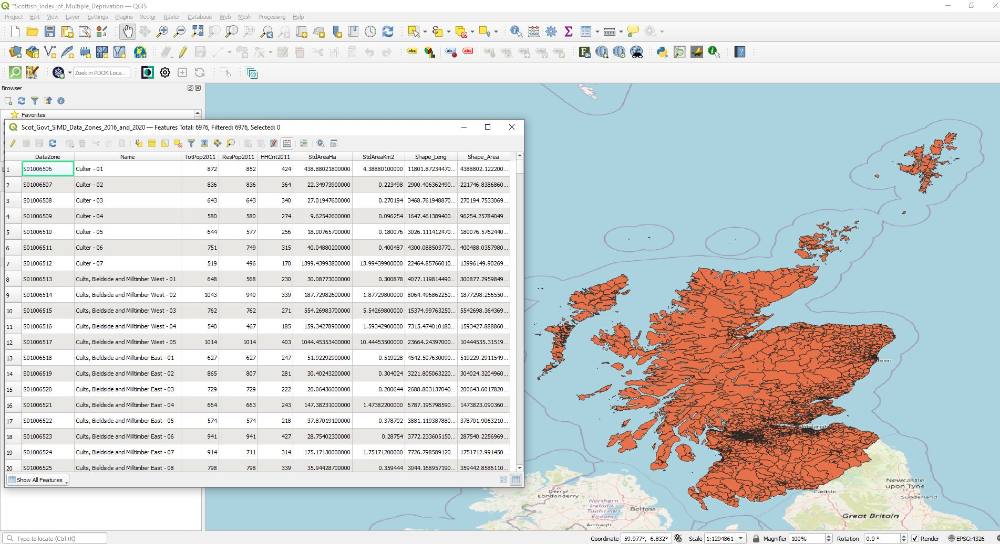

As you can see the shape file contains some basic metadata which can be accessed from by right clicking the datazones layer and selecting `Open Attribute Table`, however in order to visualize out SIMD data on the map we need to join our `simd_2020` table to our `datazones` table.

### Joining our our geospatial datazone dataset to our non-spatial SIMD dataset

In an attribute join, a GeoSeries or GeoDataFrame is combined with a regular `pandas.Series` or `pandas.DataFrame` based on a common variable. This is analogous to normal merging or joining in pandas.

In our case we can join `datazones` (a GeoDataFrame) to `simd_2020` (a pandas DataFrame) on a common variable (Data Zone - reference S12345678).

To allow us to join on this shared feature, let's first rename `Data_Zone` to `DataZone` in the `simd_2020 dataframe` :

In [29]:
simd_2020.rename(columns={"Data_Zone": "DataZone"}, inplace=True)
simd_2020.head()

,DataZone,Intermediate_Zone,Council_area,Total_population,Working_Age_population,SIMD2020v2_Rank,SIMD_2020v2_Percentile,SIMD2020v2_Vigintile,SIMD2020v2_Decile,SIMD2020v2_Quintile,...,drive_petrol,drive_GP,drive_post,drive_primary,drive_retail,drive_secondary,PT_GP,PT_post,PT_retail,broadband
0,S01006506,Culter,Aberdeen City,894,580,4691,68,14,7,4,...,2.540103,3.074295,1.616239,2.615747,1.544260,9.930833,8.863589,5.856135,6.023406,11.0
1,S01006507,Culter,Aberdeen City,793,470,4862,70,14,7,4,...,3.915072,4.309812,2.555858,3.646697,2.849656,11.042816,9.978272,7.515000,7.926029,1.0
2,S01006508,Culter,Aberdeen City,624,461,5686,82,17,9,5,...,3.323025,3.784549,1.440991,3.247325,2.062255,10.616768,8.620700,4.321493,5.770910,1.0
3,S01006509,Culter,Aberdeen City,537,307,4332,63,13,7,4,...,2.622991,2.778026,2.620681,1.936908,2.160142,10.036471,7.935112,8.433328,8.329819,11.0
4,S01006510,Culter,Aberdeen City,663,415,3913,57,12,6,3,...,2.115004,2.358335,2.408416,1.845672,1.784635,9.650000,5.568964,6.966429,6.632609,0.0


And then go ahead and join the datasets :

In [30]:
# merge geospatial datazones to non-spatial simd_2020
simd_2020_merged = datazones.merge(simd_2020, on='DataZone')
simd_2020_merged.head()

,DataZone,Name,TotPop2011,ResPop2011,HHCnt2011,StdAreaHa,StdAreaKm2,Shape_Leng,Shape_Area,geometry,...,drive_petrol,drive_GP,drive_post,drive_primary,drive_retail,drive_secondary,PT_GP,PT_post,PT_retail,broadband
0,S01006506,Culter - 01,872,852,424,438.880218,4.388801,11801.872345,4.388802e+06,"POLYGON ((-2.27748 57.09527, -2.27644 57.09521...",...,2.540103,3.074295,1.616239,2.615747,1.544260,9.930833,8.863589,5.856135,6.023406,11.0
1,S01006507,Culter - 02,836,836,364,22.349739,0.223498,2900.406362,2.217468e+05,"POLYGON ((-2.27354 57.10449, -2.27333 57.10449...",...,3.915072,4.309812,2.555858,3.646697,2.849656,11.042816,9.978272,7.515000,7.926029,1.0
2,S01006508,Culter - 03,643,643,340,27.019476,0.270194,3468.761949,2.701948e+05,"POLYGON ((-2.27443 57.10171, -2.27237 57.10046...",...,3.323025,3.784549,1.440991,3.247325,2.062255,10.616768,8.620700,4.321493,5.770910,1.0
3,S01006509,Culter - 04,580,580,274,9.625426,0.096254,1647.461389,9.625426e+04,"POLYGON ((-2.26611 57.10133, -2.26599 57.10092...",...,2.622991,2.778026,2.620681,1.936908,2.160142,10.036471,7.935112,8.433328,8.329819,11.0
4,S01006510,Culter - 05,644,577,256,18.007657,0.180076,3026.111412,1.800766e+05,"POLYGON ((-2.26013 57.10160, -2.26050 57.10134...",...,2.115004,2.358335,2.408416,1.845672,1.784635,9.650000,5.568964,6.966429,6.632609,0.0


As you can see we now have a geospatial dataset - there is a `geometry` column which includes the data zone polygons, and the other columns represent the features related to each individual datazone.

Let's save it as a shapefile for viewing in QGIS.

In [31]:
# save merged dataframe to a shapefile
simd_2020_merged.to_file('simd_2020_merged.shp')  

/tmp/ipykernel_222/619268410.py:2: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  simd_2020_merged.to_file('simd_2020_merged.shp')


### Creating a Chloropleth Map of the SIMD - 2020

When we drop this new layer into QGIS and open the attribute table, we can see that the map is generated and all the SIMD data is included. 

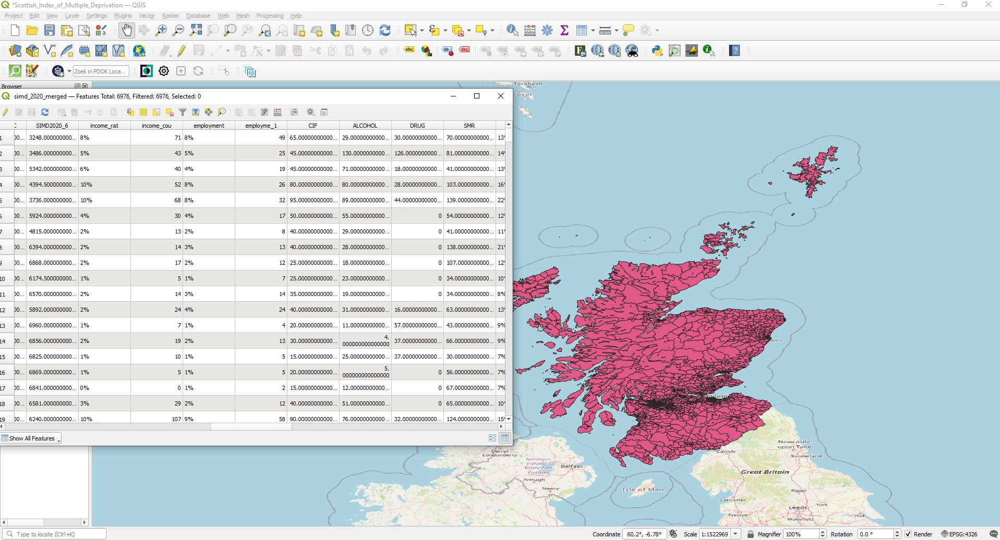

Choropleth maps are a type of thematic map used to represent spatial patterns and variations in data across different geographic regions. 

To create a new layer `SIMD_2020_Rank` right click on the `simd_2020_merged` layer and select Export / Save Features As. Then configure as follows :

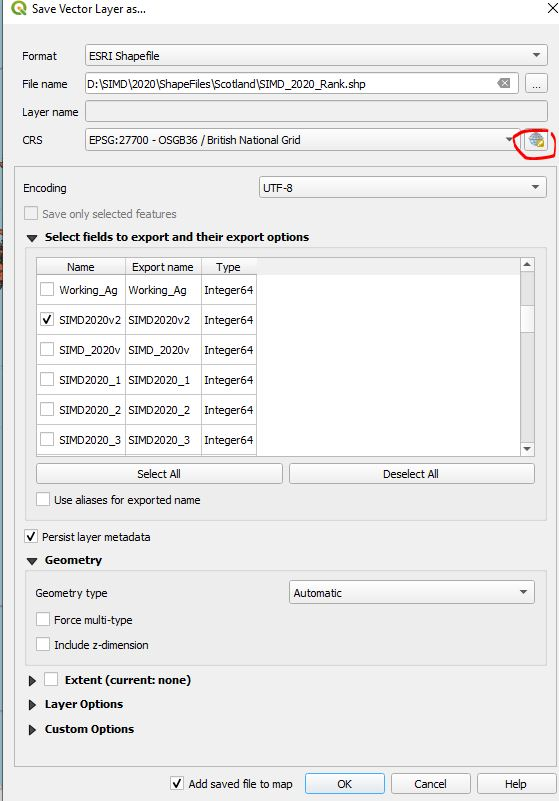

>Note that it is important to choose an appropriate  `projected coordinate system` (in my case EPSG:27700) and **not** a `geographical` coordinate system such as WGS84. This is something that ArcGis requires in order to perform a Optimized Hot Spot Analysis - see the later section on ArcGis.

#### Renaming attributes in shapefile attribute table

A character limit of 10 is applied to the shapefile column names, which is not very helpful. You can amend these as follows :

- Locate the top-most menu bar
- Go to Processing › Toolbox
- In the Processsing Toolbox, go to Vector Table › Rename field

The Rename Field window will be opened like so:
    
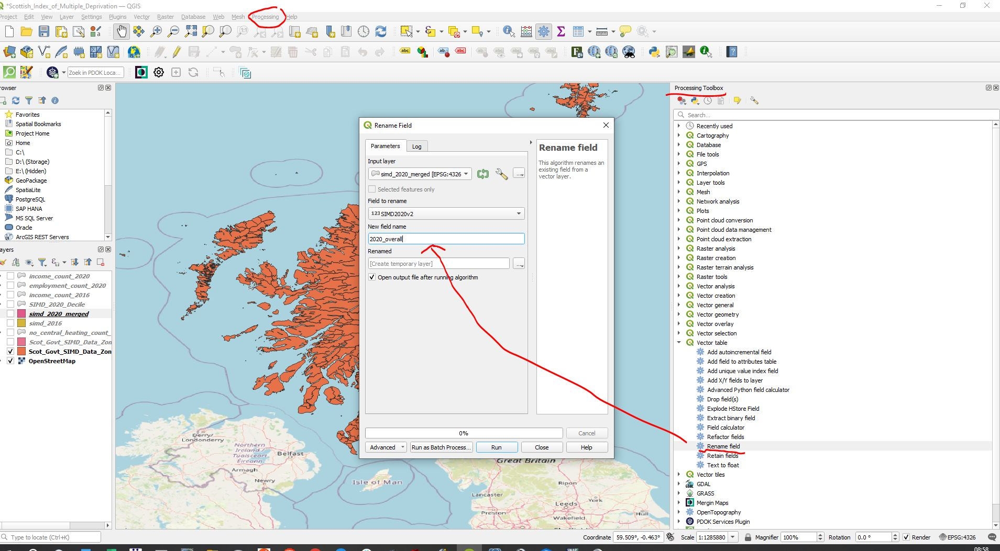

#### Creating and styling a layer

We now have a new layer named `Renamed` with more meaningful column names. Let's use this as the basis to create a new `SIMD_2020_Rank` layer to replace the original version. 

Once created we can style the layer. Right click on the layer, select `Properties` then `Symbology`. Change `Single Symbol` to `Graduated`, select `2020_SIMD` from the `Value` dropdown. 

`Color Ramp`

Choosing an appropriate colour for your map is worthy of an entire book of its own! For example for elevation often a blue to red ramp is used to symbolise the ascent from sea to sun.

I have used Blues, darker shades indicate higher levels of deprivation.

`Classification Mode`

Classification mode choice can ***strongly*** influence the story that you wish to tell. Again the subject is worthy of its own book. QGIS offers a choice of predefined modes, with the option to create your own customized mode.

In my case I have used the `Natural Breaks (Jenks)` mode of classification, and edited the legend to mirror the [interactive government SIMD map](https://simd.scot/#/simd2020/BTTTFTT/9/-4.0000/55.9000/).

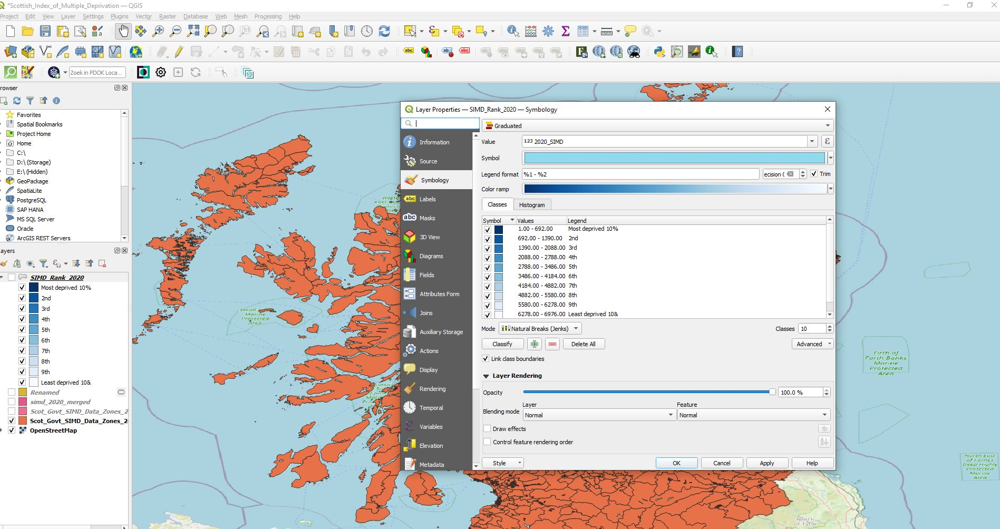

Hit OK and we have our map! We can clearly see the most deprived areas in dark blue, with the least deprived in light blue.


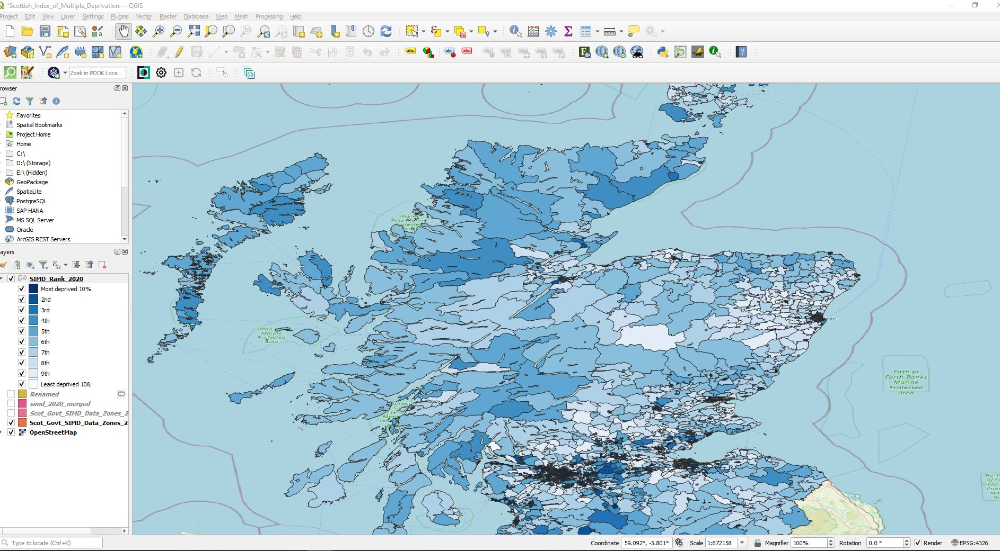

If we open the Attribute Table we can click on the `2020_SMID` column to sort by ranking. The top 20 most deprived data zones based on the SIMD 2020 are shown below:

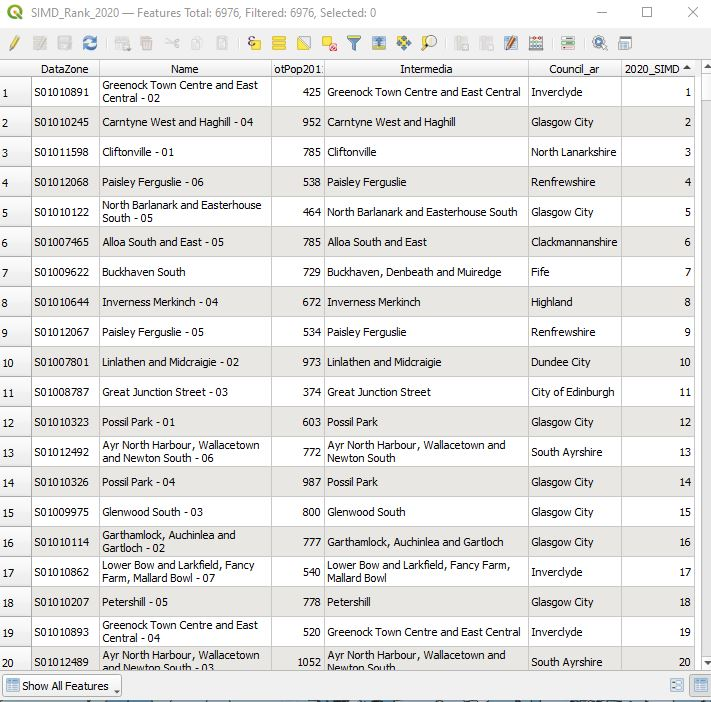

And here are the 20 least deprived data zones based on the SIMD 2020.

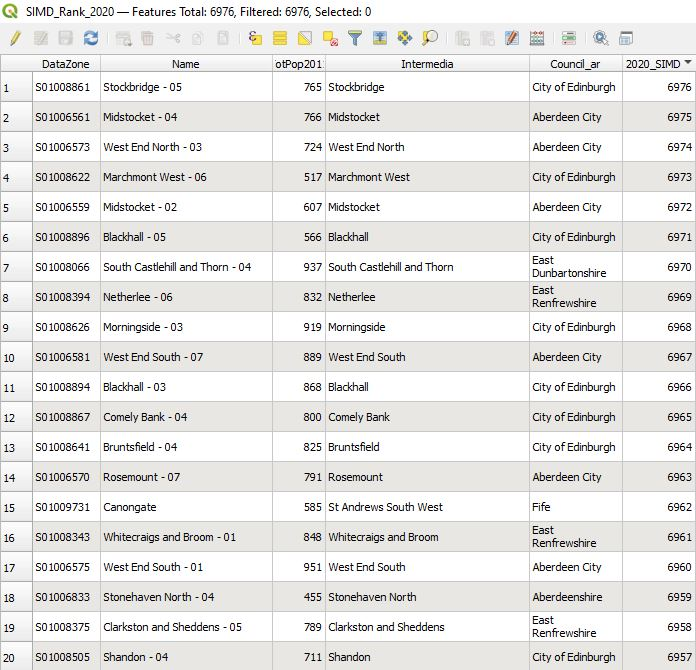

### Using Geopandas spatial operations to find which data zone a point lies in

As we saw earlier we have a GeoDataFrame that contains the geometry of each data zone polygon. I would like to identify data zone that contains the street that I was raised in. We can use Geopandas to achieve this : 

In [32]:
# Replace with the actual latitude and longitude of your location
latitude = 56.49049
longitude = -2.99560

# Create a Point geometry object from the coordinates of the location you want to check
street = Point(longitude, latitude)

In [33]:
# Use the contains or within spatial operation to check which polygon in your GeoDataFrame contains the point
matching_zones = simd_2020_merged[simd_2020_merged.geometry.contains(street)]
matching_zones

,DataZone,Name,TotPop2011,ResPop2011,HHCnt2011,StdAreaHa,StdAreaKm2,Shape_Leng,Shape_Area,geometry,...,drive_petrol,drive_GP,drive_post,drive_primary,drive_retail,drive_secondary,PT_GP,PT_post,PT_retail,broadband
1315,S01007821,Downfield - 06,552,552,244,10.111186,0.101111,2365.152085,101111.862221,"POLYGON ((-2.99561 56.49059, -2.99494 56.48985...",...,2.430788,1.990476,1.589203,2.943905,3.434769,4.120263,7.181386,7.012369,10.601427,0.0


`matching_zones` will be a subset of your GeoDataFrame containing only the data zones that contain the given point. If there are multiple matches, it will contain all of them.

Great, so I've found the data zone that I was raised in! We can print key stats of interest :

In [34]:
matching_zones.columns

Index(['DataZone', 'Name', 'TotPop2011', 'ResPop2011', 'HHCnt2011',
       'StdAreaHa', 'StdAreaKm2', 'Shape_Leng', 'Shape_Area', 'geometry',
       'Intermediate_Zone', 'Council_area', 'Total_population',
       'Working_Age_population', 'SIMD2020v2_Rank', 'SIMD_2020v2_Percentile',
       'SIMD2020v2_Vigintile', 'SIMD2020v2_Decile', 'SIMD2020v2_Quintile',
       'SIMD2020v2_Income_Domain_Rank', 'SIMD2020_Employment_Domain_Rank',
       'SIMD2020_Health_Domain_Rank', 'SIMD2020_Education_Domain_Rank',
       'SIMD2020_Access_Domain_Rank', 'SIMD2020_Crime_Domain_Rank',
       'SIMD2020_Housing_Domain_Rank', 'income_rate', 'income_count',
       'employment_rate', 'employment_count', 'CIF', 'ALCOHOL', 'DRUG', 'SMR',
       'DEPRESS', 'LBWT', 'EMERG', 'Attendance', 'Attainment',
       'no_qualifications', 'not_participating', 'University', 'crime_count',
       'crime_rate', 'overcrowded_count', 'nocentralheating_count',
       'overcrowded_rate', 'nocentralheating_rate', 'drive_petrol', 

In [35]:
for index, row in matching_zones.iterrows():
    print("Data Zone ID:", row['DataZone'])
    print("Data Zone Name:", row['Name'])
    print("Data Zone Population 2011:", row['TotPop2011'])    
    print("Council Area:" ,row['Council_area'])    
    print("SIMD 2020 Rank:", row['SIMD2020v2_Rank']) 
    print("Income Domain Rank 2020:", row['SIMD_2020v2_Percentile'])    
    print("Employment Domain Rank 2020:", row['SIMD2020_Employment_Domain_Rank'])    
    print("Health Domain Rank 2020:", row['SIMD2020_Health_Domain_Rank'])    
    print("Education Domain Rank 2020:", row['SIMD2020_Education_Domain_Rank'])    
    print("Access Domain Rank 2020:", row['SIMD2020_Access_Domain_Rank'])    
    print("Crime Domain Rank 2020:", row['SIMD2020_Crime_Domain_Rank'])    
    print("Housing Domain Rank 2020:", row['SIMD2020_Housing_Domain_Rank'])            

Data Zone ID: S01007821
Data Zone Name: Downfield - 06
Data Zone Population 2011: 552
Council Area: Dundee City
SIMD 2020 Rank: 3278
Income Domain Rank 2020: 47
Employment Domain Rank 2020: 2576.0
Health Domain Rank 2020: 3729
Education Domain Rank 2020: 2603
Access Domain Rank 2020: 5339
Crime Domain Rank 2020: 1335.0
Housing Domain Rank 2020: 2154.0


### Deconstructing the index

Let's take a look at each of the seven `Domains` that contribute to the overall index in isolation. We can simply create a new layer as before for each domain.

#### Income Domain Rank - 2020 (SMID weighting - 28%)

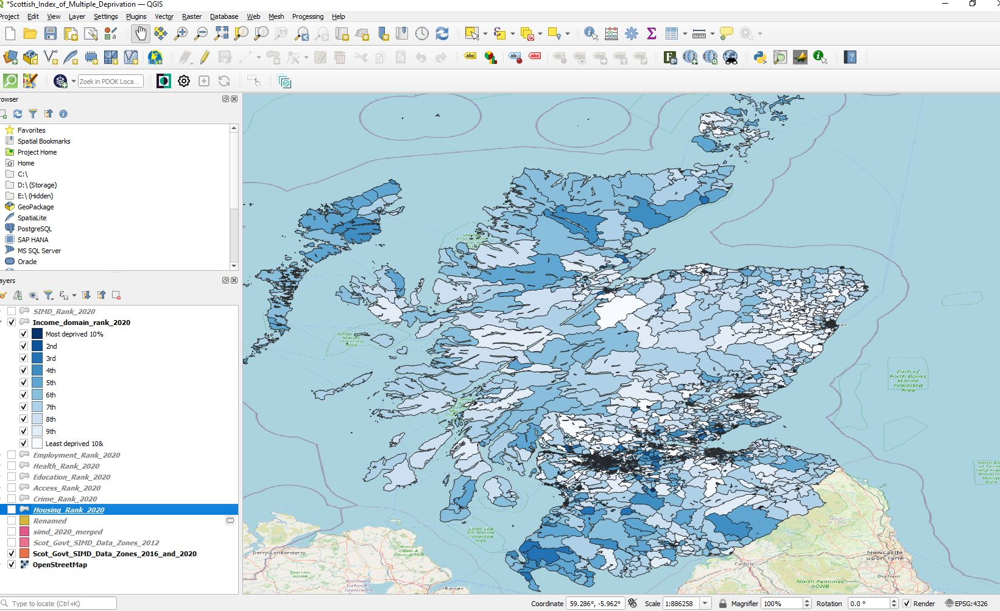

The income domain rankings are broadly similar to the overall SIMD ranking, which is as to be expected given the dominant weighting allocated to this domain. 

#### Employment Domain Rank - 2020 (SMID weighting - 28%)

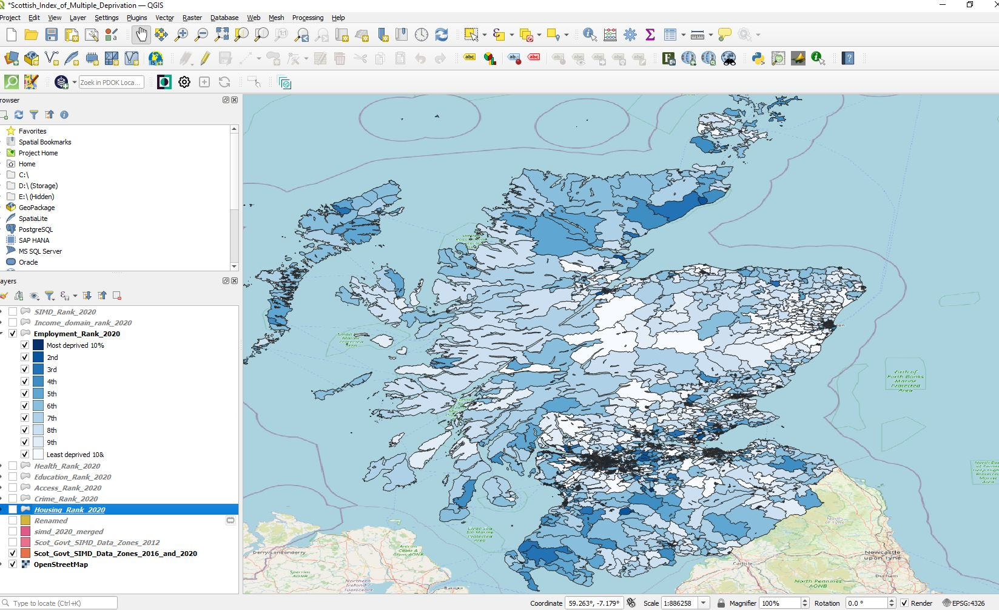

The employment domain rankings are also broadly similar to the overall SIMD ranking, which is agian to be expected given the dominant weighting allocated to this domain. 

#### Health Domain Rank - 2020 (SMID weighting - 14%)

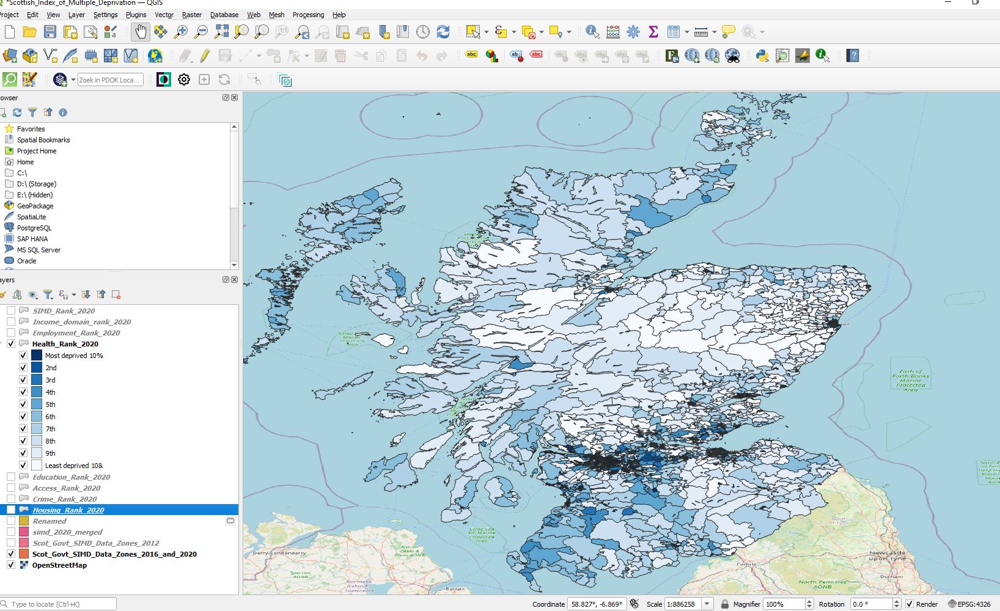

#### Education Domain Rank - 2020 (SMID weighting - 14%)

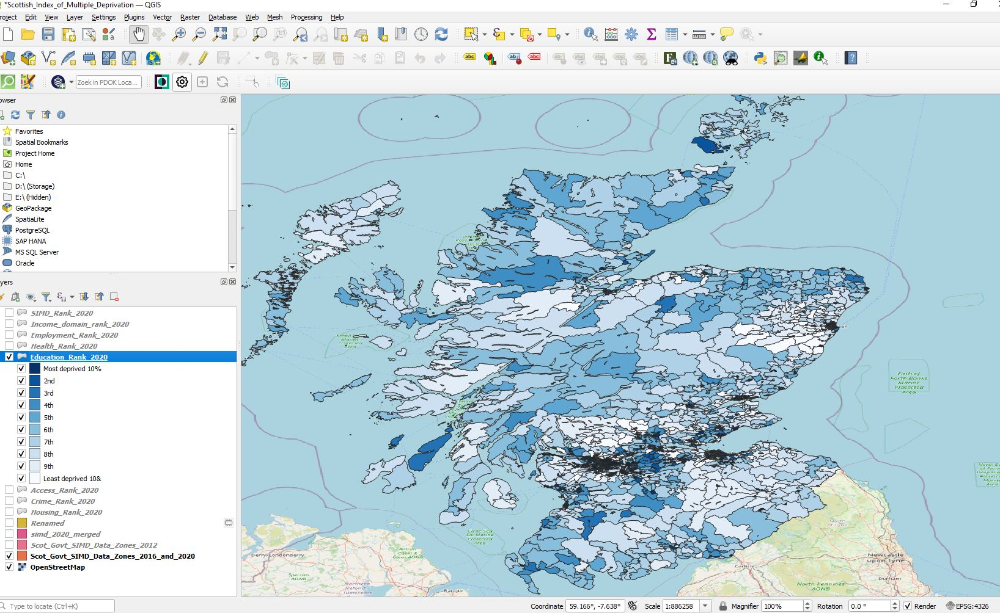

#### Access Domain Rank - 2020 (SMID weighting - 9%)

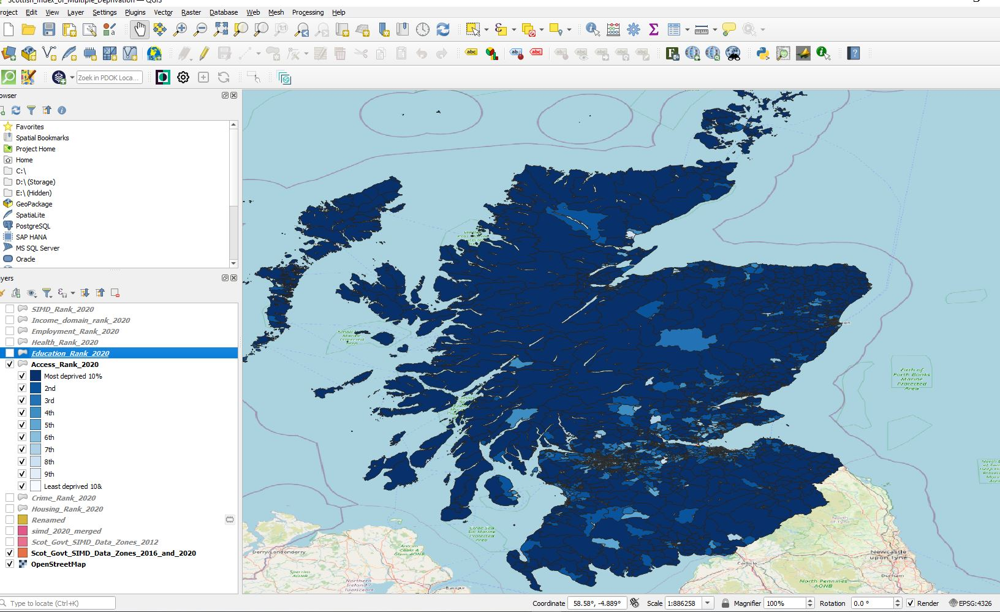

This map provides a stark insight that is not captured by the overall index, due to the small weighting applied. The large swathes of blue clearly highlight the problems that Scotland's geography creates, and the challenge faced by government to ensure that rural communities are serviced.

>Note when we zoom in to the major cities, as expected we can see that these have ready access to services.

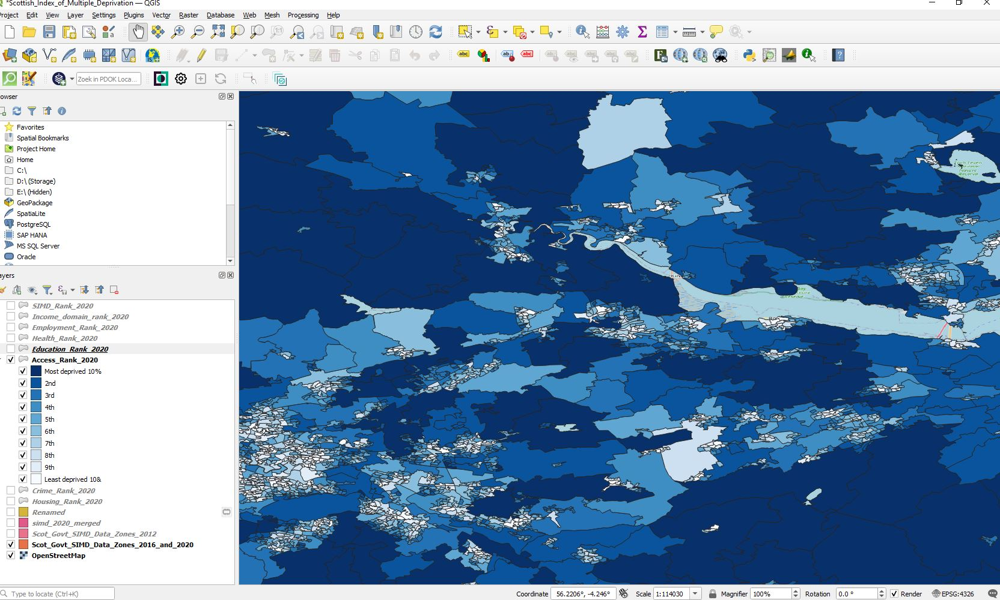

#### Access to GP 
I think it is worth looking at one particular sub-domain of the `Access` domain - access to a GP.

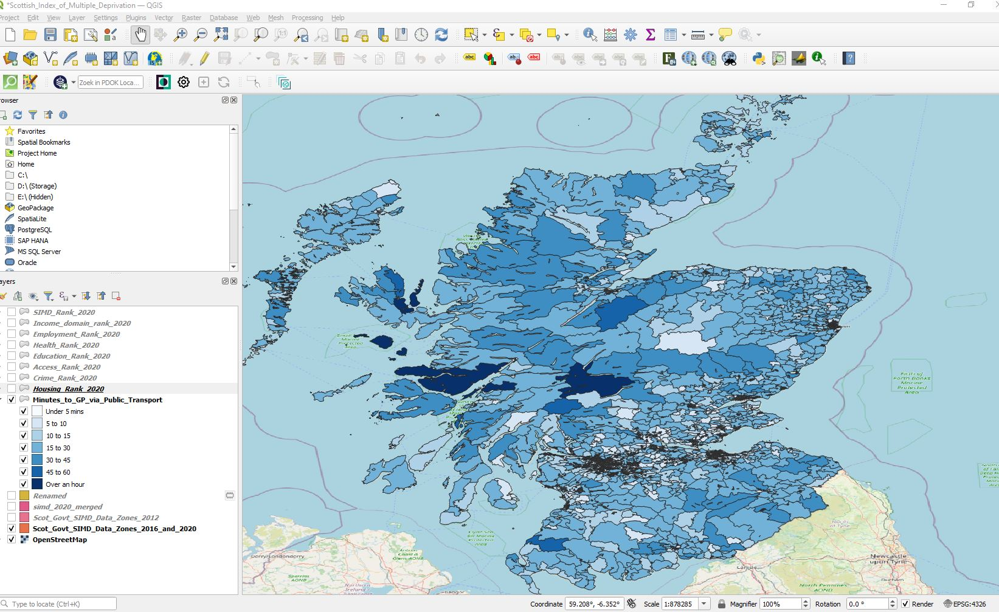

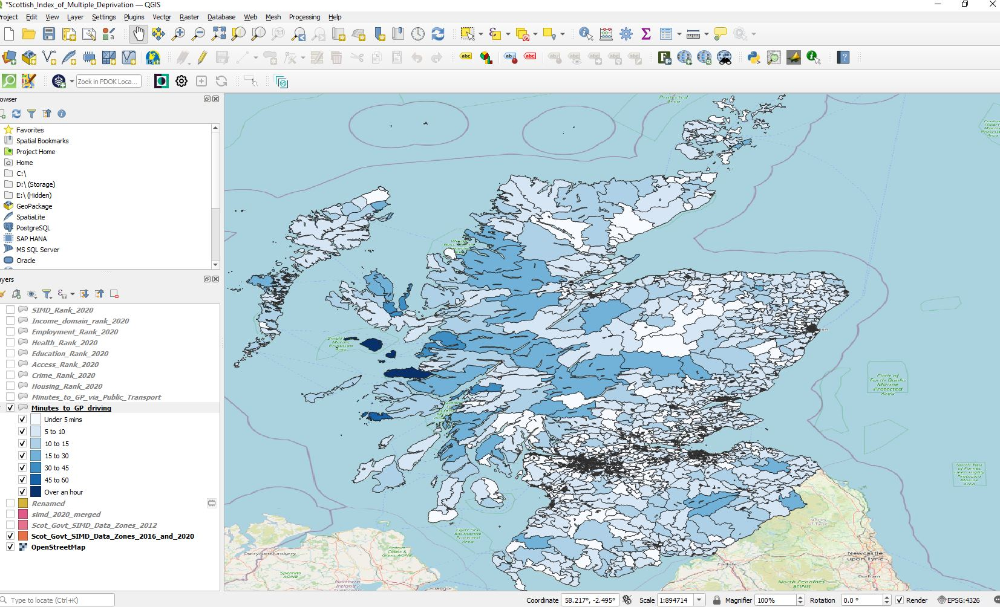

These maps further highlight the challenge faced by government to ensure that rural communities are not disproportionately isolated. The value of the life of a city dweller is of course of no less value than that of someone living in a remote area, however there is a practical dimension in terms of healthcare provision to remote communities.

#### Crime Domain Rank - 2020 (SMID weighting - 5%)

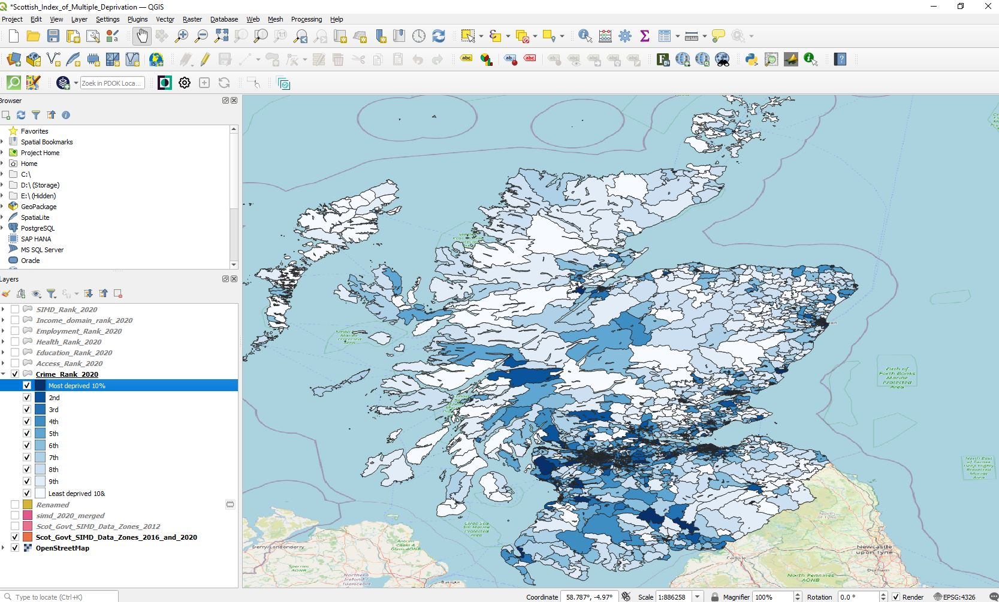

#### Housing Domain Rank 2020 (Index weighting - 2%)

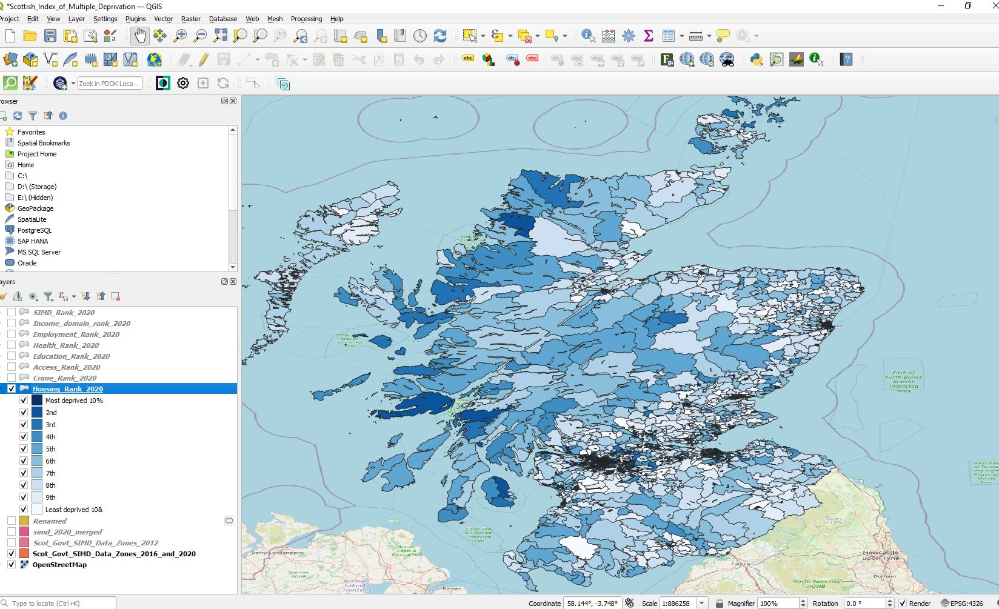


### Analysing changes in the SIMD over time 

I thought it would be a useful exercise to show the changes in the 2020 index against the 2016 index to get a picture of the changing deprivaiton landscape across data zones. 

#### ArcGis Space-Time Cube
I had hoped to harness the [Space-Time Cube](https://pro.arcgis.com/en/pro-app/latest/tool-reference/space-time-pattern-mining/learnmorecreatecube.htm) feature in ArcGis however very frustratingly you need to have a minimum of 10 time periods to use this feature!

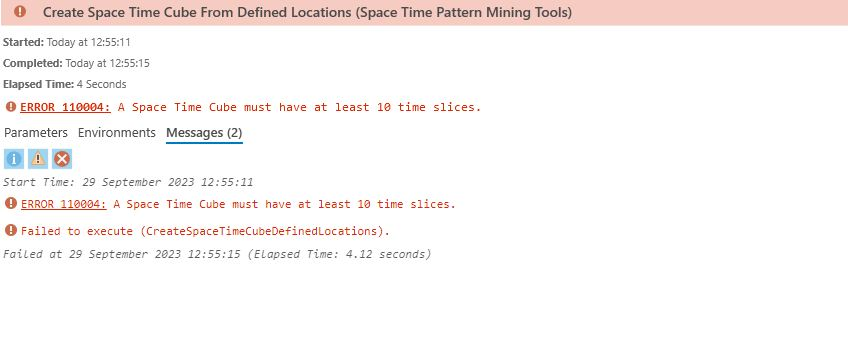


Also worthy of note. ArcGis requires a projected coordinate system and not a geographical coordinate system :

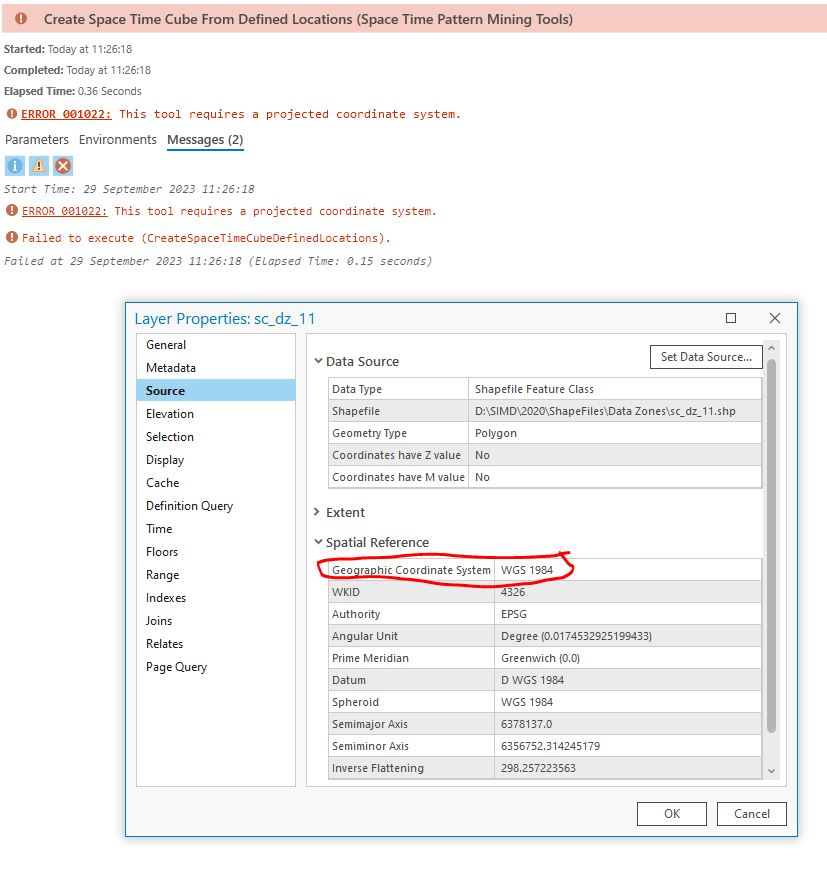

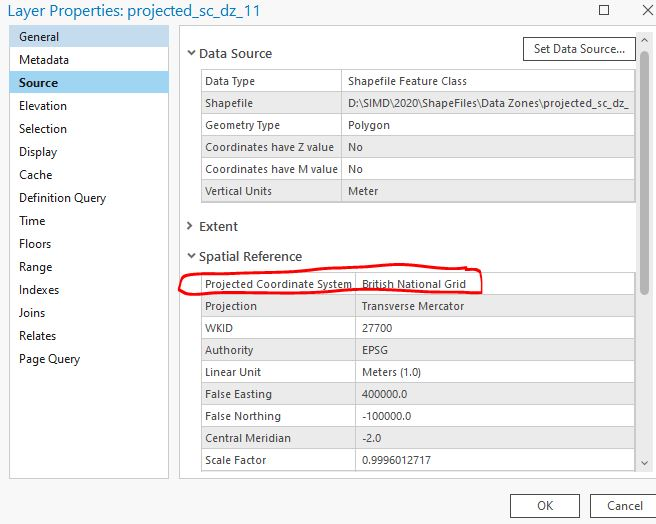

Another way to view changes between 2020 and 2016 would be to create maps for both years and view side by side. However the differences between two images can often be hard to detect. I had the idea of attempting to construct a "differences" dataset. Although this will require the 2020 and 2016 datsets to be consistent in terms of size and column names and might involve a lot of data wrangling, the end product - a **single** visualization of differences - would be worthwhile. Let's get started!

### SIMD 2016

Let's take a look at the data for 2016.

In [36]:
simd_2016 = pd.read_csv('data/simd2016_withinds.csv')
simd_2016.head()

,Data_Zone,Intermediate_Zone,Council_area,Total_population,Working_age_population_Revised,Overal_SIMD16_Rank,SIMD_2016_Percentile,SIMD_2016_Vigintile,SIMD_2016_Decile,SIMD_2016_Quintile,...,drive_retail,drive_secondary,PT_GP,PT_Post,PT_retail,crime_rate,overcrowded_count,nocentralheat_count,overcrowded_rate,nocentralheat_rate
0,S01006506,Culter,Aberdeen_City,904.0,605.0,5272.0,76.0,16.0,8.0,4.0,...,1.5,10.8,8.4,6.0,5.7,89,87.0,10.0,10%,1%
1,S01006507,Culter,Aberdeen_City,830.0,491.0,4838.0,70.0,14.0,7.0,4.0,...,2.7,11.5,8.3,7.3,6.8,48,85.0,4.0,10%,0%
2,S01006508,Culter,Aberdeen_City,694.0,519.0,6321.0,91.0,19.0,10.0,5.0,...,1.9,11.5,7.9,5.8,5.3,58,31.0,8.0,5%,1%
3,S01006509,Culter,Aberdeen_City,573.0,354.0,5363.0,77.0,16.0,8.0,4.0,...,2.2,10.8,7.4,8.3,8.4,0,42.0,6.0,7%,1%
4,S01006510,Culter,Aberdeen_City,676.0,414.0,4049.0,59.0,12.0,6.0,3.0,...,1.9,10.6,5.1,6.6,6.6,178,50.0,7.0,9%,1%


### A quick overview of our data

In [37]:
simd_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6979 entries, 0 to 6978
Data columns (total 47 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Data_Zone                           6979 non-null   object 
 1   Intermediate_Zone                   6976 non-null   object 
 2   Council_area                        6976 non-null   object 
 3   Total_population                    6976 non-null   float64
 4   Working_age_population_Revised      6976 non-null   float64
 5   Overal_SIMD16_Rank                  6976 non-null   float64
 6   SIMD_2016_Percentile                6976 non-null   float64
 7   SIMD_2016_Vigintile                 6976 non-null   float64
 8   SIMD_2016_Decile                    6976 non-null   float64
 9   SIMD_2016_Quintile                  6976 non-null   float64
 10  Income_Domain_2016_Rank             6976 non-null   float64
 11  Employment_Domain_2016_Rank         6976 no

In [38]:
nan_2016 = simd_2016.isna().sum().sort_values(ascending=False)
nan_2016

DRUG                                  3
drive_PO                              3
LBWT                                  3
EMERG                                 3
Attendance                            3
Attainment                            3
Noquals                               3
NEET                                  3
HESA                                  3
drive_petrol                          3
drive_GP                              3
drive_primary                         3
SMR                                   3
drive_retail                          3
drive_secondary                       3
PT_GP                                 3
PT_Post                               3
PT_retail                             3
crime_rate                            3
overcrowded_count                     3
nocentralheat_count                   3
overcrowded_rate                      3
DEPRESS                               3
nocentralheat_rate                    3
Intermediate_Zone                     3


In [39]:
number_nan_2016 = nan_2016.sum()

In [40]:
print(f'Our 2016 dataset contains {number_nan_2016} NaN values.')

Our 2016 dataset contains 138 NaN values.


In [41]:
# Check for columns containing '*'
columns_with_asterisk_2016 = simd_2016.columns[simd_2016.eq('*').any()]

# Print the columns containing '*'
print(columns_with_asterisk_2016)

Index(['CIF', 'DEPRESS', 'LBWT', 'Attainment', 'HESA', 'crime_rate'], dtype='object')


In [42]:
simd_2016 = simd_2016.replace('*', np.nan)

### Missing Data

In [43]:
# list number of missing values per column
simd_2016.isna().sum().sort_values(ascending=False)

Attainment                            17
HESA                                   6
DEPRESS                                5
CIF                                    5
crime_rate                             5
LBWT                                   4
drive_GP                               3
EMERG                                  3
Attendance                             3
Noquals                                3
NEET                                   3
drive_petrol                           3
DRUG                                   3
SMR                                    3
drive_primary                          3
drive_retail                           3
drive_secondary                        3
PT_GP                                  3
PT_Post                                3
PT_retail                              3
overcrowded_count                      3
nocentralheat_count                    3
overcrowded_rate                       3
drive_PO                               3
nocentralheat_ra

In [44]:
number_nan_2016 = simd_2016.isna().sum().sort_values(ascending=False)
updated_number_nan_2016 = number_nan_2016.sum()

In [45]:
print(f'Our updated 2016 dataset contains {updated_number_nan_2016} NaN values.')

Our updated 2016 dataset contains 162 NaN values.


In [46]:
simd_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6979 entries, 0 to 6978
Data columns (total 47 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Data_Zone                           6979 non-null   object 
 1   Intermediate_Zone                   6976 non-null   object 
 2   Council_area                        6976 non-null   object 
 3   Total_population                    6976 non-null   float64
 4   Working_age_population_Revised      6976 non-null   float64
 5   Overal_SIMD16_Rank                  6976 non-null   float64
 6   SIMD_2016_Percentile                6976 non-null   float64
 7   SIMD_2016_Vigintile                 6976 non-null   float64
 8   SIMD_2016_Decile                    6976 non-null   float64
 9   SIMD_2016_Quintile                  6976 non-null   float64
 10  Income_Domain_2016_Rank             6976 non-null   float64
 11  Employment_Domain_2016_Rank         6976 no

In [47]:
# Find columns containing '%' in their values
columns_with_percentage_values_2016 = simd_2016.applymap(lambda x: '%' in str(x)).any()

# Print the columns containing '%' in their values
print(columns_with_percentage_values_2016[columns_with_percentage_values_2016].index)

Index(['Income_rate', 'Employment_rate', 'DEPRESS', 'LBWT', 'Attendance',
       'NEET', 'HESA', 'overcrowded_rate', 'nocentralheat_rate'],
      dtype='object')


In [48]:
# Remove '%' from strings containing it
simd_2016 = simd_2016.applymap(lambda x: str(x).replace('%', '') if '%' in str(x) else x)
simd_2016.head()

,Data_Zone,Intermediate_Zone,Council_area,Total_population,Working_age_population_Revised,Overal_SIMD16_Rank,SIMD_2016_Percentile,SIMD_2016_Vigintile,SIMD_2016_Decile,SIMD_2016_Quintile,...,drive_retail,drive_secondary,PT_GP,PT_Post,PT_retail,crime_rate,overcrowded_count,nocentralheat_count,overcrowded_rate,nocentralheat_rate
0,S01006506,Culter,Aberdeen_City,904.0,605.0,5272.0,76.0,16.0,8.0,4.0,...,1.5,10.8,8.4,6.0,5.7,89,87.0,10.0,10,1
1,S01006507,Culter,Aberdeen_City,830.0,491.0,4838.0,70.0,14.0,7.0,4.0,...,2.7,11.5,8.3,7.3,6.8,48,85.0,4.0,10,0
2,S01006508,Culter,Aberdeen_City,694.0,519.0,6321.0,91.0,19.0,10.0,5.0,...,1.9,11.5,7.9,5.8,5.3,58,31.0,8.0,5,1
3,S01006509,Culter,Aberdeen_City,573.0,354.0,5363.0,77.0,16.0,8.0,4.0,...,2.2,10.8,7.4,8.3,8.4,0,42.0,6.0,7,1
4,S01006510,Culter,Aberdeen_City,676.0,414.0,4049.0,59.0,12.0,6.0,3.0,...,1.9,10.6,5.1,6.6,6.6,178,50.0,7.0,9,1


In [49]:
# List of column names to convert to float
columns_to_convert_2016 = ['Income_rate', 'Employment_rate', 'CIF', 'ALCOHOL', 'DEPRESS', 'LBWT', 'Attendance', 'Attainment', 'NEET', 'HESA', 'crime_rate', 'overcrowded_rate', 'nocentralheat_rate']

# Use astype to convert the specified columns to float
simd_2016[columns_to_convert_2016] = simd_2016[columns_to_convert_2016].apply(pd.to_numeric, errors='coerce') 

In [50]:
# show rows which include null values
null_data_2016 = simd_2016[simd_2016.isnull().any(axis=1)]
null_data_2016

,Data_Zone,Intermediate_Zone,Council_area,Total_population,Working_age_population_Revised,Overal_SIMD16_Rank,SIMD_2016_Percentile,SIMD_2016_Vigintile,SIMD_2016_Decile,SIMD_2016_Quintile,...,drive_retail,drive_secondary,PT_GP,PT_Post,PT_retail,crime_rate,overcrowded_count,nocentralheat_count,overcrowded_rate,nocentralheat_rate
137,S01006643,Hanover_North,Aberdeen_City,782.0,719.0,5566.0,80.0,16.0,8.0,4.0,...,3.1,5.6,3.9,5.2,7.0,333.0,207.0,48.0,28.0,7.0
140,S01006646,George_Street,Aberdeen_City,1001.0,913.0,4907.0,71.0,15.0,8.0,4.0,...,2.6,4.7,6.8,3.5,7.2,1050.0,152.0,45.0,28.0,8.0
2163,S01008669,Meadows_and_Southside,City_of_Edinburgh,532.0,488.0,6564.0,95.0,19.0,10.0,5.0,...,3.0,5.1,4.1,3.4,9.2,414.0,201.0,7.0,35.0,1.0
2343,S01008849,New_Town_West,City_of_Edinburgh,694.0,533.0,6499.0,94.0,19.0,10.0,5.0,...,3.4,3.8,7.4,4.8,6.7,620.0,114.0,35.0,16.0,5.0
2348,S01008854,Canonmills_and_New_Town_North,City_of_Edinburgh,932.0,768.0,6937.0,100.0,20.0,10.0,5.0,...,3.5,3.3,7.0,5.5,8.4,97.0,116.0,37.0,13.0,4.0
2644,S01009150,Falkirk_-_Town_Centre_and_Callendar_Park,Falkirk,759.0,166.0,895.0,13.0,3.0,2.0,1.0,...,3.9,3.6,11.2,7.6,10.3,26.0,37.0,31.0,5.0,4.0
3217,S01009723,St_Andrews_Central,Fife,951.0,834.0,6505.0,94.0,19.0,10.0,5.0,...,2.2,3.2,8.7,3.6,4.6,95.0,192.0,27.0,30.0,4.0
3505,S01010011,Mount_Florida,Glasgow_City,728.0,508.0,1634.0,24.0,5.0,3.0,2.0,...,1.4,4.0,4.8,5.8,3.8,165.0,124.0,36.0,17.0,5.0
3549,S01010055,Parkhead_West_and_Barrowfield,Glasgow_City,1200.0,829.0,67.0,1.0,1.0,1.0,1.0,...,1.7,2.6,4.9,7.5,5.4,1327.0,282.0,50.0,30.0,5.0
3700,S01010206,Petershill,Glasgow_City,0.0,0.0,4605.0,67.0,14.0,7.0,4.0,...,4.2,4.0,7.4,8.2,9.2,NaN,243.0,21.0,49.0,4.0


In [51]:
# remove rows 6976, 6977, and 6978
rows_to_remove = [6976, 6977, 6978]
simd_2016 = simd_2016.drop(rows_to_remove)

In [52]:
simd_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6976 entries, 0 to 6975
Data columns (total 47 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Data_Zone                           6976 non-null   object 
 1   Intermediate_Zone                   6976 non-null   object 
 2   Council_area                        6976 non-null   object 
 3   Total_population                    6976 non-null   float64
 4   Working_age_population_Revised      6976 non-null   float64
 5   Overal_SIMD16_Rank                  6976 non-null   float64
 6   SIMD_2016_Percentile                6976 non-null   float64
 7   SIMD_2016_Vigintile                 6976 non-null   float64
 8   SIMD_2016_Decile                    6976 non-null   float64
 9   SIMD_2016_Quintile                  6976 non-null   float64
 10  Income_Domain_2016_Rank             6976 non-null   float64
 11  Employment_Domain_2016_Rank         6976 no

In [53]:
simd_2016.describe()

,Total_population,Working_age_population_Revised,Overal_SIMD16_Rank,SIMD_2016_Percentile,SIMD_2016_Vigintile,SIMD_2016_Decile,SIMD_2016_Quintile,Income_Domain_2016_Rank,Employment_Domain_2016_Rank,Health_Domain_2016_Rank,...,drive_retail,drive_secondary,PT_GP,PT_Post,PT_retail,crime_rate,overcrowded_count,nocentralheat_count,overcrowded_rate,nocentralheat_rate
count,6976.000000,6976.000000,6976.000000,6976.000000,6976.000000,6976.000000,6976.000000,6976.000000,6976.000000,6976.000000,...,6976.000000,6976.000000,6976.000000,6976.000000,6976.000000,6974.000000,6976.000000,6976.000000,6976.000000,6976.000000
mean,766.571101,493.098337,3488.500000,50.500000,10.500000,5.500000,3.000000,3488.500000,3488.500000,3488.500000,...,5.238733,6.110751,10.266972,8.569696,13.532010,311.808288,82.332569,13.430619,10.949828,1.779960
std,188.267392,151.225436,2013.942071,28.868457,5.766794,2.872587,1.414214,2013.942071,2013.942071,2013.942071,...,6.131718,5.179672,6.182297,4.477807,10.660695,441.399811,63.921332,16.800241,7.879127,2.179844
min,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.700000,1.200000,1.600000,1.900000,1.900000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,635.000000,397.000000,1744.750000,25.750000,5.750000,3.000000,2.000000,1744.750000,1744.750000,1744.750000,...,2.800000,3.700000,6.300000,5.600000,8.000000,103.000000,35.000000,3.000000,5.000000,0.000000
50%,753.000000,474.000000,3488.500000,50.500000,10.500000,5.500000,3.000000,3488.500000,3488.500000,3488.500000,...,4.000000,4.800000,8.800000,7.500000,11.200000,207.000000,66.500000,8.000000,9.000000,1.000000
75%,877.000000,563.000000,5232.250000,75.250000,15.250000,8.000000,4.000000,5232.250000,5232.250000,5232.250000,...,5.900000,6.700000,12.300000,10.200000,16.100000,388.000000,112.000000,17.000000,15.000000,2.000000
max,3302.000000,2917.000000,6976.000000,100.000000,20.000000,10.000000,5.000000,6975.500000,6975.000000,6976.000000,...,190.000000,116.100000,108.800000,40.300000,190.000000,14580.000000,490.000000,187.000000,58.000000,21.000000


### Most and least deprived datazones - 2016

In [56]:
most_deprivation_2016 = simd_2016.Overal_SIMD16_Rank.min()
dz_most_deprivation_2016 = simd_2016.loc[simd_2016['Overal_SIMD16_Rank'] == most_deprivation_2016, 'Data_Zone'].values[0]
dz_name_most_deprivation_2016 = simd_2016.loc[simd_2016['Overal_SIMD16_Rank'] == most_deprivation_2016, 'Intermediate_Zone'].values[0]

In [57]:
print(f"The most deprived data zone in 2016 was: {dz_most_deprivation_2016}, {dz_name_most_deprivation_2016}.")

The most deprived data zone in 2016 was: S01012068, Paisley_Ferguslie.


In [59]:
least_deprivation_2016 = simd_2016.Overal_SIMD16_Rank.max()
dz_least_deprivation_2016 = simd_2016.loc[simd_2016['Overal_SIMD16_Rank'] == least_deprivation, 'Data_Zone'].values[0]
dz_name_least_deprivation_2016 = simd_2016.loc[simd_2016['Overal_SIMD16_Rank'] == least_deprivation, 'Intermediate_Zone'].values[0]

In [60]:
print(f"The least deprived data zone in 2016 was: {dz_least_deprivation_2016}, {dz_name_least_deprivation_2016}.")

The least deprived data zone in 2016 was: S01008405, Lower_Whitecraigs_and_South_Giffnock.


In [61]:
# Rename colums to allow us to join on shared feature 
simd_2016.rename(columns={"Data_Zone": "DataZone"}, inplace=True)
simd_2016.head()

,DataZone,Intermediate_Zone,Council_area,Total_population,Working_age_population_Revised,Overal_SIMD16_Rank,SIMD_2016_Percentile,SIMD_2016_Vigintile,SIMD_2016_Decile,SIMD_2016_Quintile,...,drive_retail,drive_secondary,PT_GP,PT_Post,PT_retail,crime_rate,overcrowded_count,nocentralheat_count,overcrowded_rate,nocentralheat_rate
0,S01006506,Culter,Aberdeen_City,904.0,605.0,5272.0,76.0,16.0,8.0,4.0,...,1.5,10.8,8.4,6.0,5.7,89.0,87.0,10.0,10.0,1.0
1,S01006507,Culter,Aberdeen_City,830.0,491.0,4838.0,70.0,14.0,7.0,4.0,...,2.7,11.5,8.3,7.3,6.8,48.0,85.0,4.0,10.0,0.0
2,S01006508,Culter,Aberdeen_City,694.0,519.0,6321.0,91.0,19.0,10.0,5.0,...,1.9,11.5,7.9,5.8,5.3,58.0,31.0,8.0,5.0,1.0
3,S01006509,Culter,Aberdeen_City,573.0,354.0,5363.0,77.0,16.0,8.0,4.0,...,2.2,10.8,7.4,8.3,8.4,0.0,42.0,6.0,7.0,1.0
4,S01006510,Culter,Aberdeen_City,676.0,414.0,4049.0,59.0,12.0,6.0,3.0,...,1.9,10.6,5.1,6.6,6.6,178.0,50.0,7.0,9.0,1.0


In [62]:
# merge geospatial datazones to non-spatial simd_2016
simd_2016_merged = datazones.merge(simd_2016, on='DataZone')
simd_2016_merged.head()

,DataZone,Name,TotPop2011,ResPop2011,HHCnt2011,StdAreaHa,StdAreaKm2,Shape_Leng,Shape_Area,geometry,...,drive_retail,drive_secondary,PT_GP,PT_Post,PT_retail,crime_rate,overcrowded_count,nocentralheat_count,overcrowded_rate,nocentralheat_rate
0,S01006506,Culter - 01,872,852,424,438.880218,4.388801,11801.872345,4.388802e+06,"POLYGON ((-2.27748 57.09527, -2.27644 57.09521...",...,1.5,10.8,8.4,6.0,5.7,89.0,87.0,10.0,10.0,1.0
1,S01006507,Culter - 02,836,836,364,22.349739,0.223498,2900.406362,2.217468e+05,"POLYGON ((-2.27354 57.10449, -2.27333 57.10449...",...,2.7,11.5,8.3,7.3,6.8,48.0,85.0,4.0,10.0,0.0
2,S01006508,Culter - 03,643,643,340,27.019476,0.270194,3468.761949,2.701948e+05,"POLYGON ((-2.27443 57.10171, -2.27237 57.10046...",...,1.9,11.5,7.9,5.8,5.3,58.0,31.0,8.0,5.0,1.0
3,S01006509,Culter - 04,580,580,274,9.625426,0.096254,1647.461389,9.625426e+04,"POLYGON ((-2.26611 57.10133, -2.26599 57.10092...",...,2.2,10.8,7.4,8.3,8.4,0.0,42.0,6.0,7.0,1.0
4,S01006510,Culter - 05,644,577,256,18.007657,0.180076,3026.111412,1.800766e+05,"POLYGON ((-2.26013 57.10160, -2.26050 57.10134...",...,1.9,10.6,5.1,6.6,6.6,178.0,50.0,7.0,9.0,1.0


In [63]:
simd_2016_merged.shape

(6976, 56)

In [64]:
simd_2020_merged.shape

(6976, 58)

### Data inconsistency

So, both sets have 6976 observations as expected (one for each Data Zone) but the 2020 dataset has an extra two columns. Let's investigate this further by using set theory to pinpoint the changes to the column names.

In [65]:
# convert column names into a set
set_columns_2016 = set(simd_2016_merged.columns)
set_columns_2016

{'ALCOHOL',
 'Attainment',
 'Attendance',
 'CIF',
 'Council_area',
 'Crime_Domain_2016_Rank',
 'DEPRESS',
 'DRUG',
 'DataZone',
 'EMERG',
 'Education_Domain_2016_Rank',
 'Employment_Domain_2016_Rank',
 'Employment_count',
 'Employment_rate',
 'Geographic_Access_Domain_2016_Rank',
 'HESA',
 'HHCnt2011',
 'Health_Domain_2016_Rank',
 'Housing_Domain_2016_Rank',
 'Income_Domain_2016_Rank',
 'Income_count',
 'Income_rate',
 'Intermediate_Zone',
 'LBWT',
 'NEET',
 'Name',
 'Noquals',
 'Overal_SIMD16_Rank',
 'PT_GP',
 'PT_Post',
 'PT_retail',
 'ResPop2011',
 'SIMD_2016_Decile',
 'SIMD_2016_Percentile',
 'SIMD_2016_Quintile',
 'SIMD_2016_Vigintile',
 'SMR',
 'Shape_Area',
 'Shape_Leng',
 'StdAreaHa',
 'StdAreaKm2',
 'TotPop2011',
 'Total_population',
 'Working_age_population_Revised',
 'crime_rate',
 'drive_GP',
 'drive_PO',
 'drive_petrol',
 'drive_primary',
 'drive_retail',
 'drive_secondary',
 'geometry',
 'nocentralheat_count',
 'nocentralheat_rate',
 'overcrowded_count',
 'overcrowded_rat

In [66]:
# convert colum names into a set
set_columns_2020 = set(simd_2020_merged.columns)
set_columns_2020

{'ALCOHOL',
 'Attainment',
 'Attendance',
 'CIF',
 'Council_area',
 'DEPRESS',
 'DRUG',
 'DataZone',
 'EMERG',
 'HHCnt2011',
 'Intermediate_Zone',
 'LBWT',
 'Name',
 'PT_GP',
 'PT_post',
 'PT_retail',
 'ResPop2011',
 'SIMD2020_Access_Domain_Rank',
 'SIMD2020_Crime_Domain_Rank',
 'SIMD2020_Education_Domain_Rank',
 'SIMD2020_Employment_Domain_Rank',
 'SIMD2020_Health_Domain_Rank',
 'SIMD2020_Housing_Domain_Rank',
 'SIMD2020v2_Decile',
 'SIMD2020v2_Income_Domain_Rank',
 'SIMD2020v2_Quintile',
 'SIMD2020v2_Rank',
 'SIMD2020v2_Vigintile',
 'SIMD_2020v2_Percentile',
 'SMR',
 'Shape_Area',
 'Shape_Leng',
 'StdAreaHa',
 'StdAreaKm2',
 'TotPop2011',
 'Total_population',
 'University',
 'Working_Age_population',
 'broadband',
 'crime_count',
 'crime_rate',
 'drive_GP',
 'drive_petrol',
 'drive_post',
 'drive_primary',
 'drive_retail',
 'drive_secondary',
 'employment_count',
 'employment_rate',
 'geometry',
 'income_count',
 'income_rate',
 'no_qualifications',
 'nocentralheating_count',
 'nocen

In [67]:
# Find columns unique to set_2020
unique_to_columns_2020 = set_columns_2020 - set_columns_2016
unique_to_columns_2020

{'PT_post',
 'SIMD2020_Access_Domain_Rank',
 'SIMD2020_Crime_Domain_Rank',
 'SIMD2020_Education_Domain_Rank',
 'SIMD2020_Employment_Domain_Rank',
 'SIMD2020_Health_Domain_Rank',
 'SIMD2020_Housing_Domain_Rank',
 'SIMD2020v2_Decile',
 'SIMD2020v2_Income_Domain_Rank',
 'SIMD2020v2_Quintile',
 'SIMD2020v2_Rank',
 'SIMD2020v2_Vigintile',
 'SIMD_2020v2_Percentile',
 'University',
 'Working_Age_population',
 'broadband',
 'crime_count',
 'drive_post',
 'employment_count',
 'employment_rate',
 'income_count',
 'income_rate',
 'no_qualifications',
 'nocentralheating_count',
 'nocentralheating_rate',
 'not_participating'}

In [68]:
# Find columns unique to set_2016
unique_to_columns_2016 = set_columns_2016 - set_columns_2020
unique_to_columns_2016

{'Crime_Domain_2016_Rank',
 'Education_Domain_2016_Rank',
 'Employment_Domain_2016_Rank',
 'Employment_count',
 'Employment_rate',
 'Geographic_Access_Domain_2016_Rank',
 'HESA',
 'Health_Domain_2016_Rank',
 'Housing_Domain_2016_Rank',
 'Income_Domain_2016_Rank',
 'Income_count',
 'Income_rate',
 'NEET',
 'Noquals',
 'Overal_SIMD16_Rank',
 'PT_Post',
 'SIMD_2016_Decile',
 'SIMD_2016_Percentile',
 'SIMD_2016_Quintile',
 'SIMD_2016_Vigintile',
 'Working_age_population_Revised',
 'drive_PO',
 'nocentralheat_count',
 'nocentralheat_rate'}

### Rename columns

In [69]:
simd_2020_merged.rename(columns={'SIMD2020_Access_Domain_Rank': 'Access_Domain_Rank',
 'SIMD2020_Crime_Domain_Rank': 'Crime_Domain_Rank',
 'SIMD2020_Education_Domain_Rank':'Education_Domain_Rank',
 'SIMD2020_Employment_Domain_Rank': 'Employment_Domain_Rank',
 'SIMD2020_Health_Domain_Rank':'Health_Domain_Rank',
 'SIMD2020_Housing_Domain_Rank':'Housing_Domain_Rank',
 'SIMD2020v2_Decile':'Decile',
 'SIMD2020v2_Income_Domain_Rank':'Income_Domain_Rank',
 'SIMD2020v2_Quintile':'Quintile',
 'SIMD2020v2_Rank':'Rank',
 'SIMD2020v2_Vigintile': 'Vigintile',
 'SIMD_2020v2_Percentile':'Percentile'},inplace=True)

simd_2020_merged

,DataZone,Name,TotPop2011,ResPop2011,HHCnt2011,StdAreaHa,StdAreaKm2,Shape_Leng,Shape_Area,geometry,...,drive_petrol,drive_GP,drive_post,drive_primary,drive_retail,drive_secondary,PT_GP,PT_post,PT_retail,broadband
0,S01006506,Culter - 01,872,852,424,438.880218,4.388801,11801.872345,4.388802e+06,"POLYGON ((-2.27748 57.09527, -2.27644 57.09521...",...,2.540103,3.074295,1.616239,2.615747,1.544260,9.930833,8.863589,5.856135,6.023406,11.0
1,S01006507,Culter - 02,836,836,364,22.349739,0.223498,2900.406362,2.217468e+05,"POLYGON ((-2.27354 57.10449, -2.27333 57.10449...",...,3.915072,4.309812,2.555858,3.646697,2.849656,11.042816,9.978272,7.515000,7.926029,1.0
2,S01006508,Culter - 03,643,643,340,27.019476,0.270194,3468.761949,2.701948e+05,"POLYGON ((-2.27443 57.10171, -2.27237 57.10046...",...,3.323025,3.784549,1.440991,3.247325,2.062255,10.616768,8.620700,4.321493,5.770910,1.0
3,S01006509,Culter - 04,580,580,274,9.625426,0.096254,1647.461389,9.625426e+04,"POLYGON ((-2.26611 57.10133, -2.26599 57.10092...",...,2.622991,2.778026,2.620681,1.936908,2.160142,10.036471,7.935112,8.433328,8.329819,11.0
4,S01006510,Culter - 05,644,577,256,18.007657,0.180076,3026.111412,1.800766e+05,"POLYGON ((-2.26013 57.10160, -2.26050 57.10134...",...,2.115004,2.358335,2.408416,1.845672,1.784635,9.650000,5.568964,6.966429,6.632609,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6971,S01013477,Broxburn South - 06,605,605,303,10.988164,0.109882,1775.782199,1.098816e+05,"POLYGON ((-3.46323 55.93434, -3.46319 55.93408...",...,2.732500,3.706674,1.690504,3.148465,1.559616,5.930057,7.693930,4.175574,4.284855,0.0
6972,S01013478,Broxburn East - 01,860,851,358,12.438169,0.124382,2319.192976,1.243817e+05,"POLYGON ((-3.48355 55.93733, -3.48354 55.93728...",...,5.227738,1.922628,1.977860,2.979797,2.815971,3.425031,6.550913,6.485256,7.598948,0.0
6973,S01013479,Broxburn East - 02,786,781,428,26.714576,0.267145,3234.544766,2.671458e+05,"POLYGON ((-3.46664 55.93627, -3.46652 55.93622...",...,3.664326,3.613521,1.657220,2.530326,1.445423,5.912698,7.355121,4.006667,4.412252,1.0
6974,S01013480,Broxburn East - 03,671,671,302,9.624700,0.096248,1598.577583,9.624701e+04,"POLYGON ((-3.46259 55.93774, -3.46243 55.93725...",...,3.251885,4.625972,2.600421,3.541645,2.127917,6.626376,10.176170,6.409534,6.928539,0.0


In [70]:
simd_2016_merged.rename(columns={'Crime_Domain_2016_Rank': 'Crime_Domain_Rank' ,
 'Education_Domain_2016_Rank':'Education_Domain_Rank',
 'Employment_Domain_2016_Rank': 'Employment_Domain_Rank',
 'Employment_count':'employment_count',
 'Employment_rate':'employment_rate',
 'Geographic_Access_Domain_2016_Rank': 'Access_Domain_Rank',
 'HESA':'University',
 'Health_Domain_2016_Rank': 'Health_Domain_Rank',
 'Housing_Domain_2016_Rank':'Housing_Domain_Rank',
 'Income_Domain_2016_Rank':'Income_Domain_Rank',
 'Income_count':'income_count',
 'Income_rate':'income_rate',
 'NEET':'not_participating',
 'Noquals':'no_qualifications',
 'Overal_SIMD16_Rank':'Rank',
 'PT_Post':'PT_post',
 'SIMD_2016_Decile': 'Decile',
 'SIMD_2016_Percentile': 'Percentile',
 'SIMD_2016_Quintile':'Quintile',
 'SIMD_2016_Vigintile':'Vigintile',
 'Working_age_population_Revised':'Working_Age_population',
 'drive_PO':'drive_post',
 'nocentralheat_count':'nocentralheating_count',
 'nocentralheat_rate':'nocentralheating_rate'},
                 inplace=True)

simd_2016_merged

,DataZone,Name,TotPop2011,ResPop2011,HHCnt2011,StdAreaHa,StdAreaKm2,Shape_Leng,Shape_Area,geometry,...,drive_retail,drive_secondary,PT_GP,PT_post,PT_retail,crime_rate,overcrowded_count,nocentralheating_count,overcrowded_rate,nocentralheating_rate
0,S01006506,Culter - 01,872,852,424,438.880218,4.388801,11801.872345,4.388802e+06,"POLYGON ((-2.27748 57.09527, -2.27644 57.09521...",...,1.5,10.8,8.4,6.0,5.7,89.0,87.0,10.0,10.0,1.0
1,S01006507,Culter - 02,836,836,364,22.349739,0.223498,2900.406362,2.217468e+05,"POLYGON ((-2.27354 57.10449, -2.27333 57.10449...",...,2.7,11.5,8.3,7.3,6.8,48.0,85.0,4.0,10.0,0.0
2,S01006508,Culter - 03,643,643,340,27.019476,0.270194,3468.761949,2.701948e+05,"POLYGON ((-2.27443 57.10171, -2.27237 57.10046...",...,1.9,11.5,7.9,5.8,5.3,58.0,31.0,8.0,5.0,1.0
3,S01006509,Culter - 04,580,580,274,9.625426,0.096254,1647.461389,9.625426e+04,"POLYGON ((-2.26611 57.10133, -2.26599 57.10092...",...,2.2,10.8,7.4,8.3,8.4,0.0,42.0,6.0,7.0,1.0
4,S01006510,Culter - 05,644,577,256,18.007657,0.180076,3026.111412,1.800766e+05,"POLYGON ((-2.26013 57.10160, -2.26050 57.10134...",...,1.9,10.6,5.1,6.6,6.6,178.0,50.0,7.0,9.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6971,S01013477,Broxburn South - 06,605,605,303,10.988164,0.109882,1775.782199,1.098816e+05,"POLYGON ((-3.46323 55.93434, -3.46319 55.93408...",...,1.5,5.5,7.3,4.9,4.8,648.0,93.0,10.0,15.0,2.0
6972,S01013478,Broxburn East - 01,860,851,358,12.438169,0.124382,2319.192976,1.243817e+05,"POLYGON ((-3.48355 55.93733, -3.48354 55.93728...",...,2.5,3.3,6.7,7.3,7.8,238.0,87.0,1.0,10.0,0.0
6973,S01013479,Broxburn East - 02,786,781,428,26.714576,0.267145,3234.544766,2.671458e+05,"POLYGON ((-3.46664 55.93627, -3.46652 55.93622...",...,1.4,5.4,7.2,4.3,4.2,597.0,96.0,9.0,12.0,1.0
6974,S01013480,Broxburn East - 03,671,671,302,9.624700,0.096248,1598.577583,9.624701e+04,"POLYGON ((-3.46259 55.93774, -3.46243 55.93725...",...,2.1,6.3,8.2,5.9,6.2,167.0,107.0,1.0,16.0,0.0


Let's check to see if there are any more column inconsistencies :

In [71]:
# convert colum names into a set
set_columns_2020 = set(simd_2020_merged.columns)
set_columns_2016 = set(simd_2016_merged.columns)
unique_to_columns_2020 = set_columns_2020 - set_columns_2016
unique_to_columns_2020

{'broadband', 'crime_count'}

In [72]:
unique_to_columns_2016 = set_columns_2016 - set_columns_2020
unique_to_columns_2016

set()

So, the only differences are that 2020 introduced a new indicator `broadband` and there is no `crime_count` column for 2016 contrary to the indicator description. Let's drop these columns and proceed.

In [73]:
# remove the columns
simd_2020_merged.drop(columns=['broadband', 'crime_count'], inplace=True)

Excellent. So we now have consistent 2020 and 2016 datasets. Let's create a new dataset of differences. 

In [74]:
simd_2020_merged.columns

Index(['DataZone', 'Name', 'TotPop2011', 'ResPop2011', 'HHCnt2011',
       'StdAreaHa', 'StdAreaKm2', 'Shape_Leng', 'Shape_Area', 'geometry',
       'Intermediate_Zone', 'Council_area', 'Total_population',
       'Working_Age_population', 'Rank', 'Percentile', 'Vigintile', 'Decile',
       'Quintile', 'Income_Domain_Rank', 'Employment_Domain_Rank',
       'Health_Domain_Rank', 'Education_Domain_Rank', 'Access_Domain_Rank',
       'Crime_Domain_Rank', 'Housing_Domain_Rank', 'income_rate',
       'income_count', 'employment_rate', 'employment_count', 'CIF', 'ALCOHOL',
       'DRUG', 'SMR', 'DEPRESS', 'LBWT', 'EMERG', 'Attendance', 'Attainment',
       'no_qualifications', 'not_participating', 'University', 'crime_rate',
       'overcrowded_count', 'nocentralheating_count', 'overcrowded_rate',
       'nocentralheating_rate', 'drive_petrol', 'drive_GP', 'drive_post',
       'drive_primary', 'drive_retail', 'drive_secondary', 'PT_GP', 'PT_post',
       'PT_retail'],
      dtype='object')

In [75]:
diff_columns = ['Total_population',
       'Working_Age_population', 'Rank', 'Percentile', 'Vigintile', 'Decile',
       'Quintile', 'Income_Domain_Rank', 'Employment_Domain_Rank',
       'Health_Domain_Rank', 'Education_Domain_Rank', 'Access_Domain_Rank',
       'Crime_Domain_Rank', 'Housing_Domain_Rank', 'income_rate',
       'income_count', 'employment_rate', 'employment_count', 'CIF', 'ALCOHOL',
       'DRUG', 'SMR', 'DEPRESS', 'LBWT', 'EMERG', 'Attendance', 'Attainment',
       'no_qualifications', 'not_participating', 'University', 'crime_rate',
       'overcrowded_count', 'nocentralheating_count', 'overcrowded_rate',
       'nocentralheating_rate', 'drive_petrol', 'drive_GP', 'drive_post',
       'drive_primary', 'drive_retail', 'drive_secondary', 'PT_GP', 'PT_post',
       'PT_retail']

In [76]:
simd_2020_merged.set_index('DataZone', inplace=True)
simd_2016_merged.set_index('DataZone', inplace=True)

In [77]:
# Ensure both dataframes have the same columns and are in the same order
simd_2020_merged = simd_2020_merged[diff_columns]
simd_2016_merged = simd_2016_merged[diff_columns]

In [78]:
simd_diff_2016_2020 = simd_2020_merged - simd_2016_merged
simd_diff_2016_2020

,Total_population,Working_Age_population,Rank,Percentile,Vigintile,Decile,Quintile,Income_Domain_Rank,Employment_Domain_Rank,Health_Domain_Rank,...,nocentralheating_rate,drive_petrol,drive_GP,drive_post,drive_primary,drive_retail,drive_secondary,PT_GP,PT_post,PT_retail
DataZone,,,,,,,,,,,,,,,,,,,,,
S01006506,-10.0,-25.0,-581.0,-8.0,-2.0,-1.0,0.0,-577.0,-1040.0,268.0,...,0.0,0.140103,0.174295,0.116239,0.615747,0.044260,-0.869167,0.463589,-0.143865,0.323406
S01006507,-37.0,-21.0,24.0,0.0,0.0,0.0,0.0,495.0,-349.0,-19.0,...,0.0,0.215072,0.309812,-0.144142,0.546697,0.149656,-0.457184,1.678272,0.215000,1.126029
S01006508,-70.0,-58.0,-635.0,-9.0,-2.0,-1.0,0.0,-806.0,-991.0,105.0,...,0.0,0.123025,0.184549,-0.659009,0.547325,0.162255,-0.883232,0.720700,-1.478507,0.470910
S01006509,-36.0,-47.0,-1031.0,-14.0,-3.0,-1.0,0.0,-1521.0,-1370.0,-87.0,...,0.0,0.122991,0.278026,0.620681,0.536908,-0.039858,-0.763529,0.535112,0.133328,-0.070181
S01006510,-13.0,1.0,-136.0,-2.0,0.0,0.0,0.0,3.0,-607.0,21.0,...,0.0,0.015004,0.158335,0.708416,0.345672,-0.115365,-0.950000,0.468964,0.366429,0.032609
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
S01013477,-8.0,-29.0,271.0,4.0,1.0,0.0,0.0,465.0,434.0,414.0,...,0.0,0.132500,0.306674,-0.209496,0.648465,0.059616,0.430057,0.393930,-0.724426,-0.515145
S01013478,-26.0,-23.0,473.0,7.0,1.0,1.0,0.0,699.0,629.0,202.0,...,0.0,0.527738,0.122628,-0.222140,1.079797,0.315971,0.125031,-0.149087,-0.814744,-0.201052
S01013479,-5.0,-27.0,-218.0,-3.0,0.0,0.0,0.0,215.5,-346.0,-571.0,...,0.0,0.164326,0.313521,-0.142780,0.130326,0.045423,0.512698,0.155121,-0.293333,0.212252


In [79]:
simd_diff_2016_2020.columns

Index(['Total_population', 'Working_Age_population', 'Rank', 'Percentile',
       'Vigintile', 'Decile', 'Quintile', 'Income_Domain_Rank',
       'Employment_Domain_Rank', 'Health_Domain_Rank', 'Education_Domain_Rank',
       'Access_Domain_Rank', 'Crime_Domain_Rank', 'Housing_Domain_Rank',
       'income_rate', 'income_count', 'employment_rate', 'employment_count',
       'CIF', 'ALCOHOL', 'DRUG', 'SMR', 'DEPRESS', 'LBWT', 'EMERG',
       'Attendance', 'Attainment', 'no_qualifications', 'not_participating',
       'University', 'crime_rate', 'overcrowded_count',
       'nocentralheating_count', 'overcrowded_rate', 'nocentralheating_rate',
       'drive_petrol', 'drive_GP', 'drive_post', 'drive_primary',
       'drive_retail', 'drive_secondary', 'PT_GP', 'PT_post', 'PT_retail'],
      dtype='object')

In [81]:
# merge geospatial datazones
simd_diff_2016_2020_merged = datazones.merge(simd_diff_2016_2020, on='DataZone')
simd_diff_2016_2020_merged.head()

,DataZone,Name,TotPop2011,ResPop2011,HHCnt2011,StdAreaHa,StdAreaKm2,Shape_Leng,Shape_Area,geometry,...,nocentralheating_rate,drive_petrol,drive_GP,drive_post,drive_primary,drive_retail,drive_secondary,PT_GP,PT_post,PT_retail
0,S01006506,Culter - 01,872,852,424,438.880218,4.388801,11801.872345,4.388802e+06,"POLYGON ((-2.27748 57.09527, -2.27644 57.09521...",...,0.0,0.140103,0.174295,0.116239,0.615747,0.044260,-0.869167,0.463589,-0.143865,0.323406
1,S01006507,Culter - 02,836,836,364,22.349739,0.223498,2900.406362,2.217468e+05,"POLYGON ((-2.27354 57.10449, -2.27333 57.10449...",...,0.0,0.215072,0.309812,-0.144142,0.546697,0.149656,-0.457184,1.678272,0.215000,1.126029
2,S01006508,Culter - 03,643,643,340,27.019476,0.270194,3468.761949,2.701948e+05,"POLYGON ((-2.27443 57.10171, -2.27237 57.10046...",...,0.0,0.123025,0.184549,-0.659009,0.547325,0.162255,-0.883232,0.720700,-1.478507,0.470910
3,S01006509,Culter - 04,580,580,274,9.625426,0.096254,1647.461389,9.625426e+04,"POLYGON ((-2.26611 57.10133, -2.26599 57.10092...",...,0.0,0.122991,0.278026,0.620681,0.536908,-0.039858,-0.763529,0.535112,0.133328,-0.070181
4,S01006510,Culter - 05,644,577,256,18.007657,0.180076,3026.111412,1.800766e+05,"POLYGON ((-2.26013 57.10160, -2.26050 57.10134...",...,0.0,0.015004,0.158335,0.708416,0.345672,-0.115365,-0.950000,0.468964,0.366429,0.032609


In [82]:
# save merged dataframe to a shapefile
simd_diff_2016_2020_merged.to_file('simd_diff_2016_2020_merged.shp')  

/tmp/ipykernel_222/4260494113.py:2: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  simd_diff_2016_2020_merged.to_file('simd_diff_2016_2020_merged.shp')


### Visualizing the difference dataset in QGIS

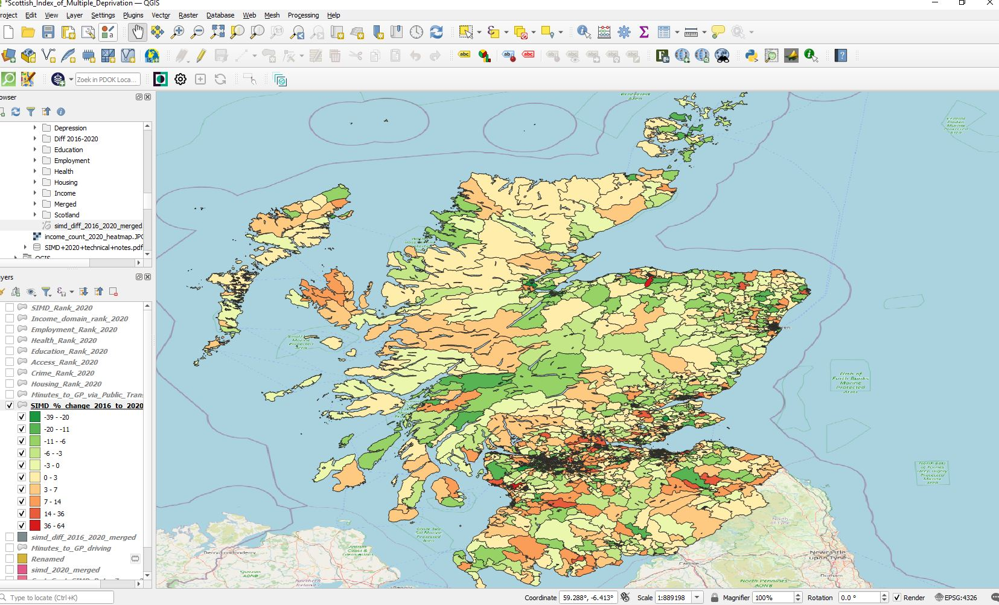

So here we can see in one graphic how the change in the percentile for each datazone from 2016 to 2020. Dark green indicates the areas with the biggest improvement in percentile, whilst dark red represents the biggest drop in peecentile.

Let me just check my datazone again - which was SI S01007821.

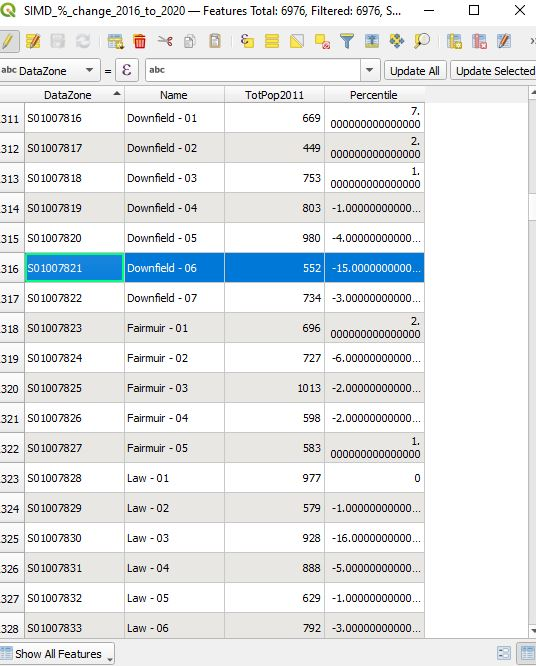

A change of -15. That's good! Remember that a fall in percentile is a positive thing as it means a lower "deprivation" score.


## ArcGis

As part of the Esri MOOC ***Spatial Data Science: The New Frontier in Analytics*** I have access to ArcGis Pro and discovered the Optimized Hot Spot and Outlier analysis tools. Let's now see those tools in action.

### Detect patterns

Statistical cluster analysis can help you minimize the subjectivity in your maps by identifying meaningful clusters in your data. The Hot Spot Analysis and Outlier Analysis tools use statistics to detect spatial patterns in your data, but each provides slightly different information about these patterns.

ArcGIS provides traditional and optimized statistical cluster analysis tools. The optimized tools interrogate your data to provide smart default values, optimizing the analysis workflow. The traditional tools allow you more flexibility in defining the spatial relationships in your data, giving you more control over your analysis. 

### Optimized Hot Spot Analysis

The `Hot Spot Analysis` tool uses the **Getis-Ord Gi*** statistic to identify statistically significant spatial clusters of high values (hot spots) and low values (cold spots).

The result of your analysis is a layer displaying hot spots in three shades of red and cold spots in three shades of blue. The varying shades correspond to three confidence intervals, indicating how confident you can be that these patterns are not the result of random chance.


#### Income Deprived - 2020 - Hotspot Analysis

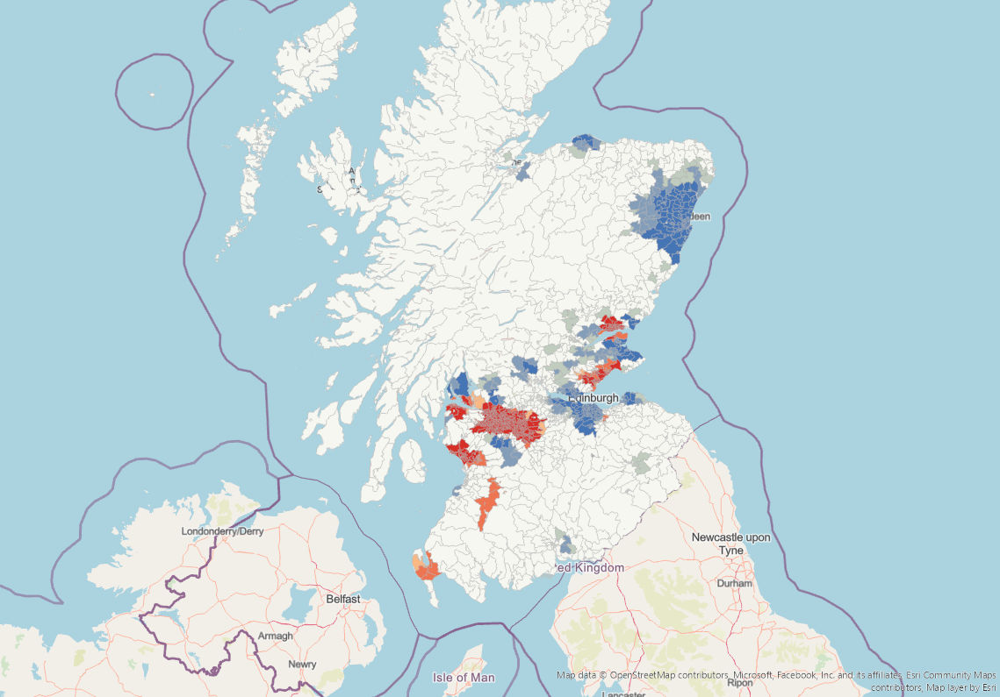


We can clearly see that large parts of the Glasgow area, significant pockets of Edinburgh and Dundee, and a pocket of Aberdeen are shown to be income deprived hotspots. 


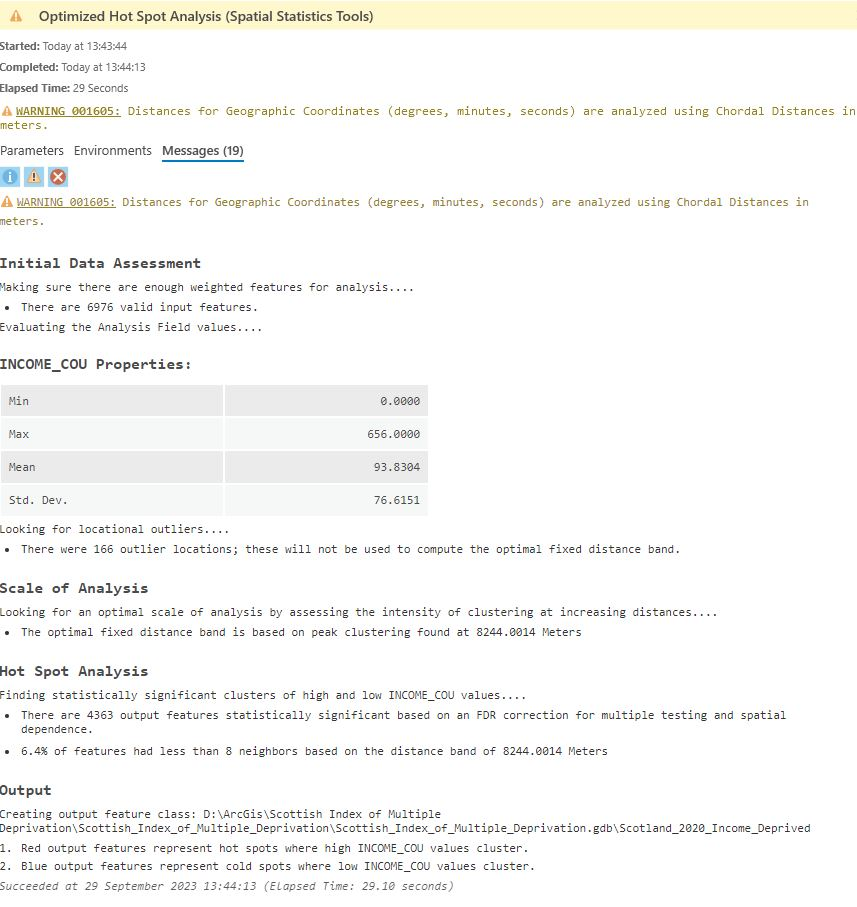

#### Employment Deprived - 2020 - Hotspot Analysis

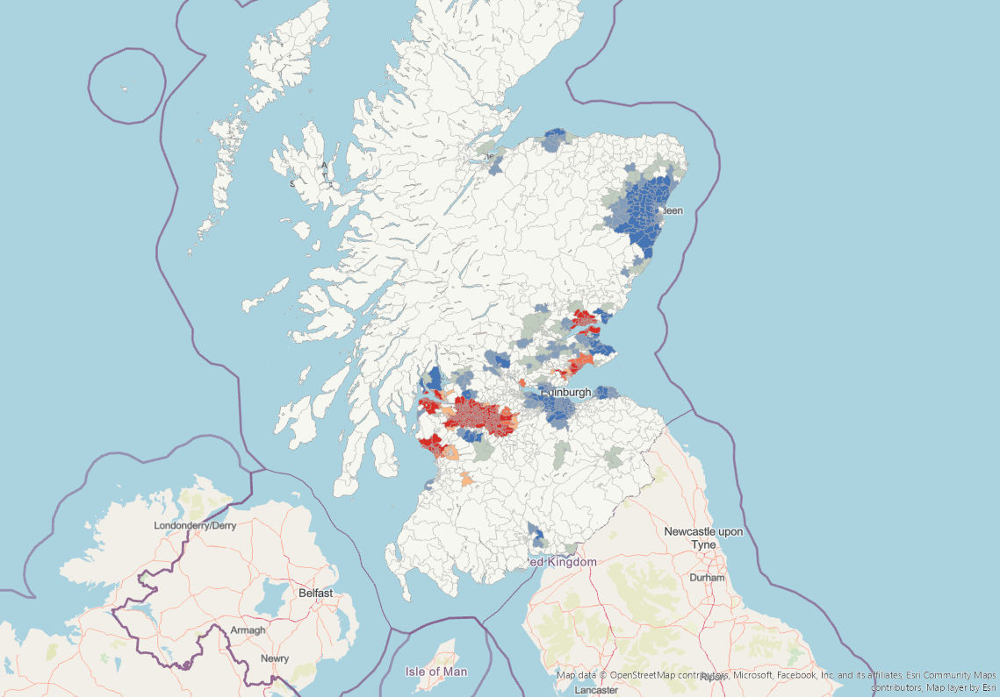

Interestingly the Aberdeen pocket of Income Deprived is not replicated when it comes to Employment. The Glasgow, Edinburgh and Dundee pattern broadly resembles that for income deprivation.


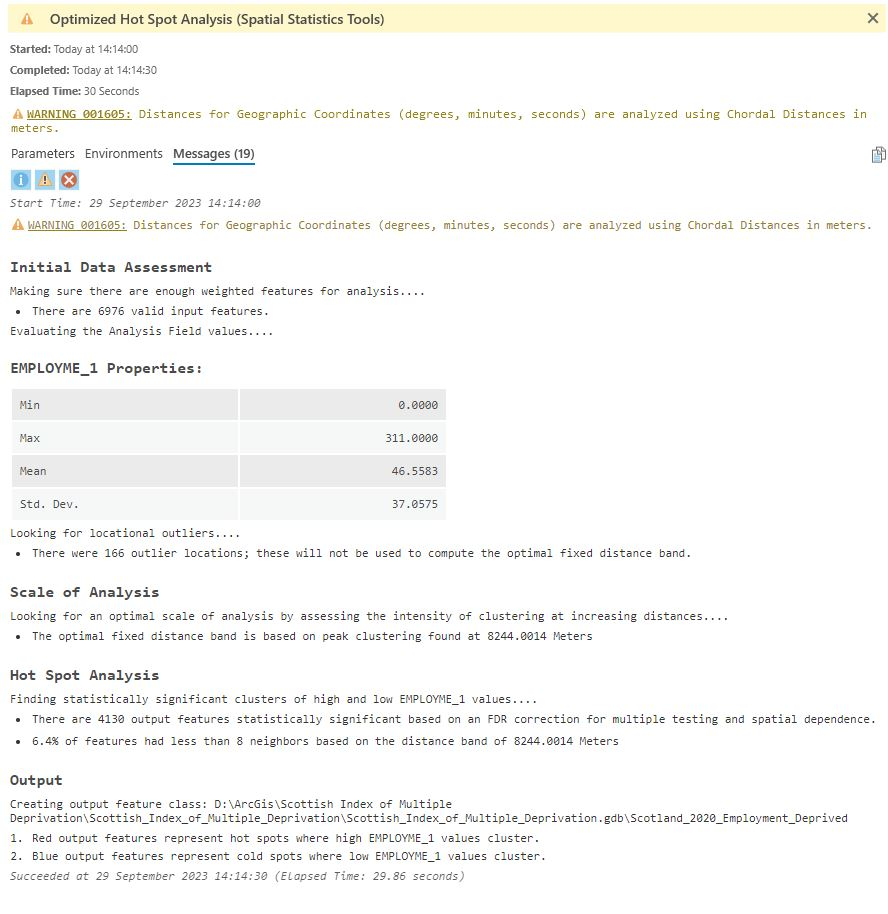

#### Overcrowded - 2020 - Hotspot Analysis

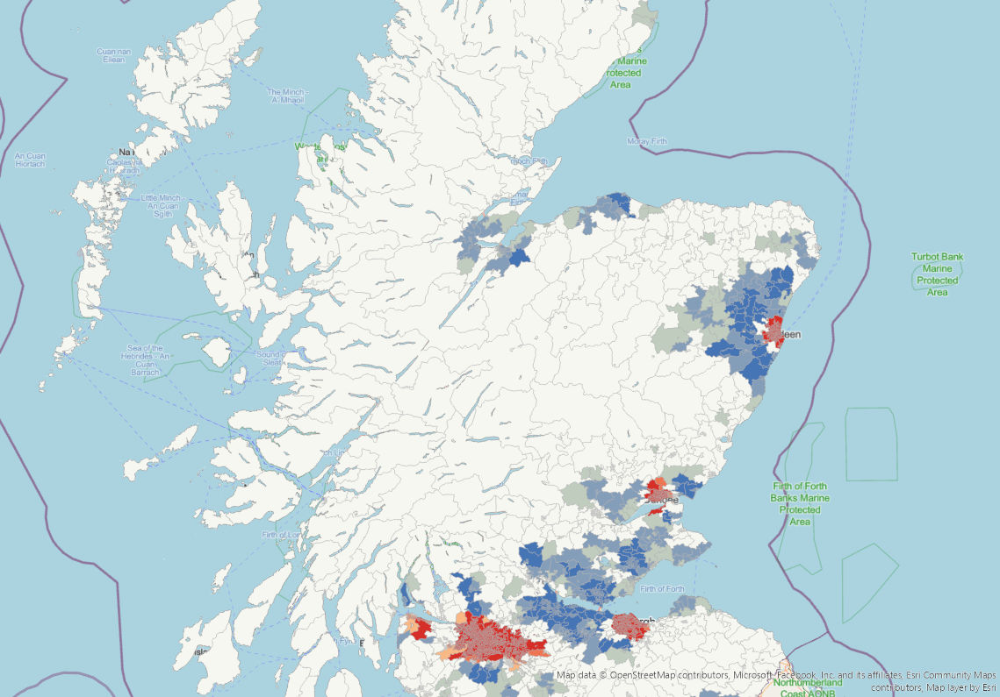

As one might expect, the four main cities are overcrowding hotspots, emphasizing the continuing need for new affordable housing.

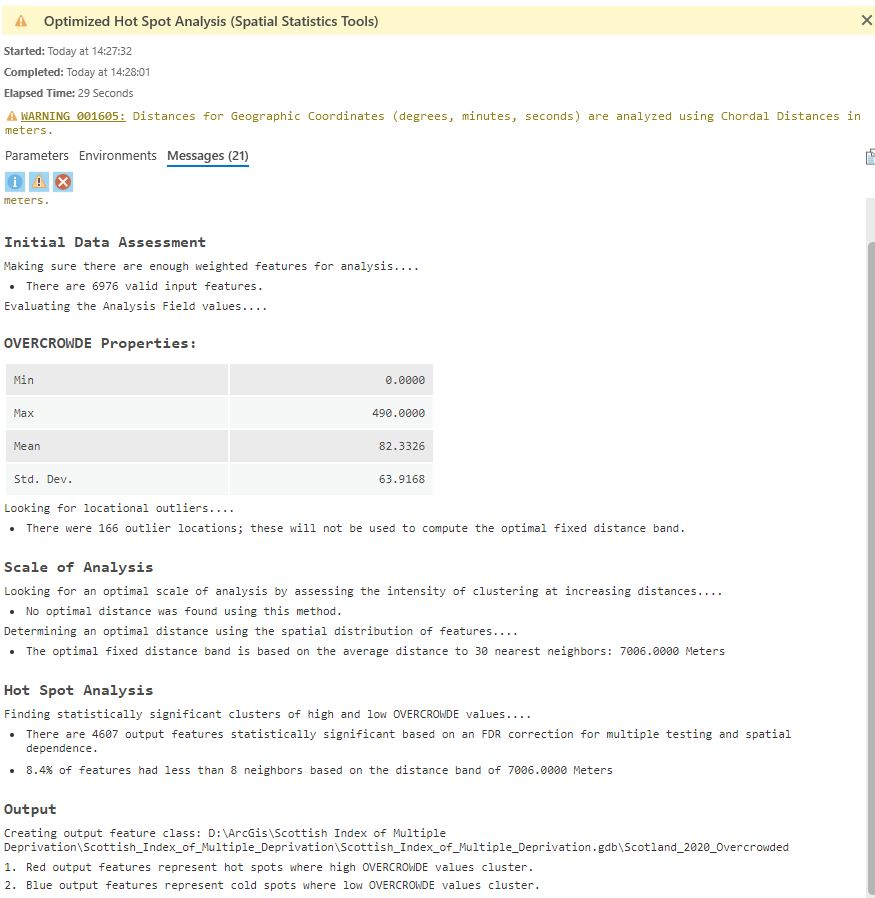

#### Drivetime to GP surgery - 2020 - Hotspot Analysis

Ready and speedy access to healthcare is critical. The four major cities, Glasgow, Edinburgh, Aberdeen, and Dundee all have quick access to a GP, however large swathes of the country are vulnerable as illustrated by the following graphic, and highlights the challenge faced by government to ensure that rural communities are serviced.

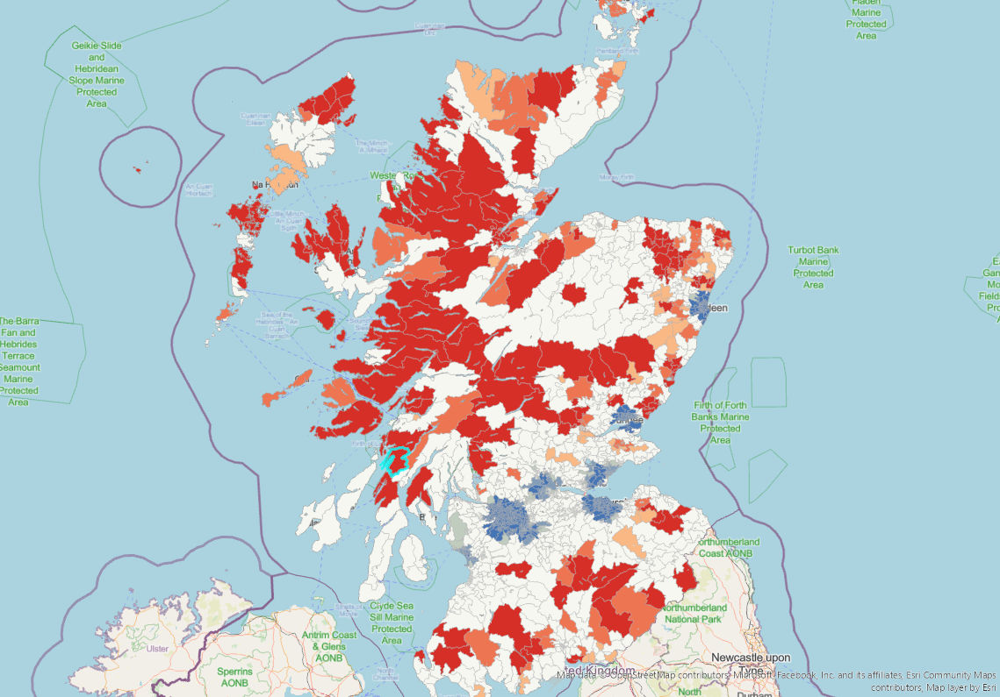

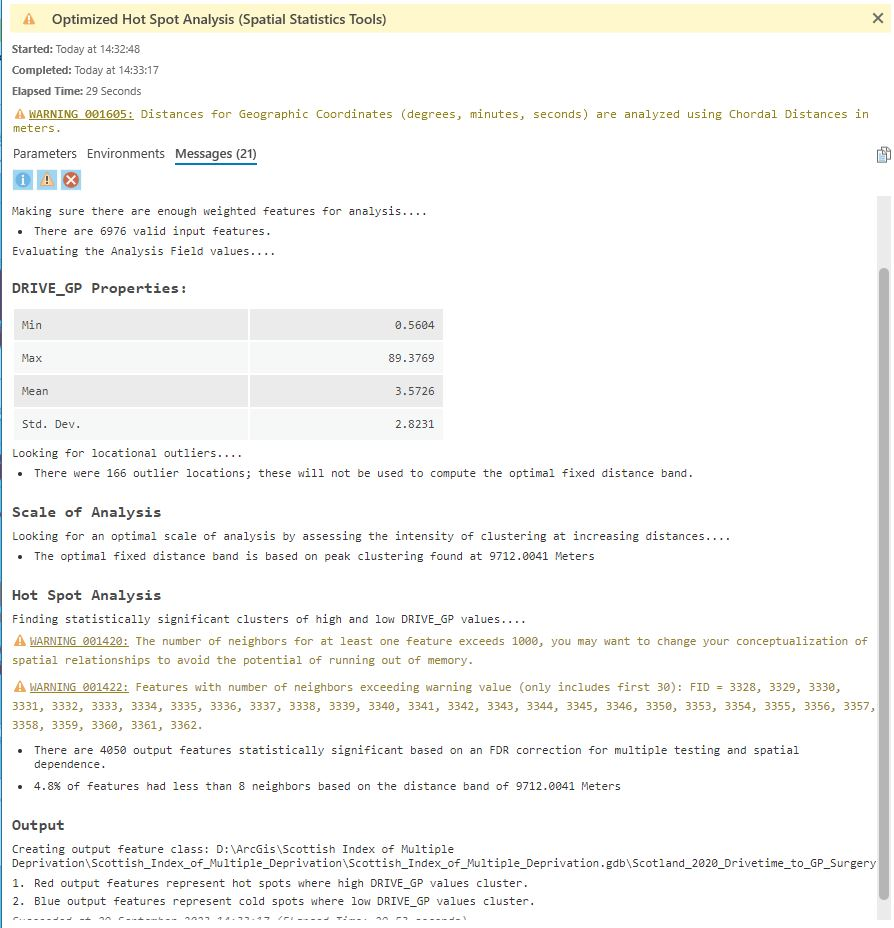

Now that we have seen some examples of hotspot areas in Scotland with respect to certain indicators, let's now turn our attention to Outlier Analysis.

### Outlier Analysis
The `Outlier Analysis` tool uses the **Anselin Local Moran's I** statistic to identify statistically significant clusters of high and low values and to detect spatial outliers, or features with values that are significantly dissimilar from their neighbors.

The bright red and blue features represent spatial outliers. Features with high values surrounded by areas with low values are called `High-Low` outliers and are displayed in `red`. Features with low values surrounded by areas with high values are called `Low-High` outliers and are displayed in `dark blue`. The pink and light blue colors indicate clusters of features with statistically significantly high values (pink) and statistically significantly low values (light blue). These clusters typically align with the hot spots and cold spots from the Optimized Hot Spot Analysis tool.

#### Income Deprived - 2020 - Outlier Analysis

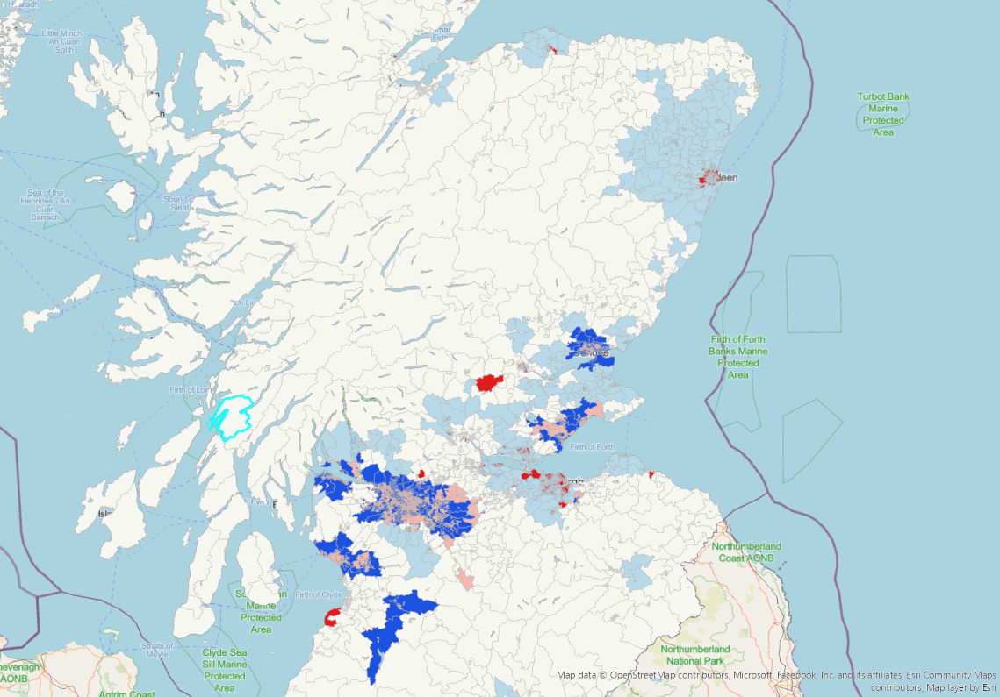

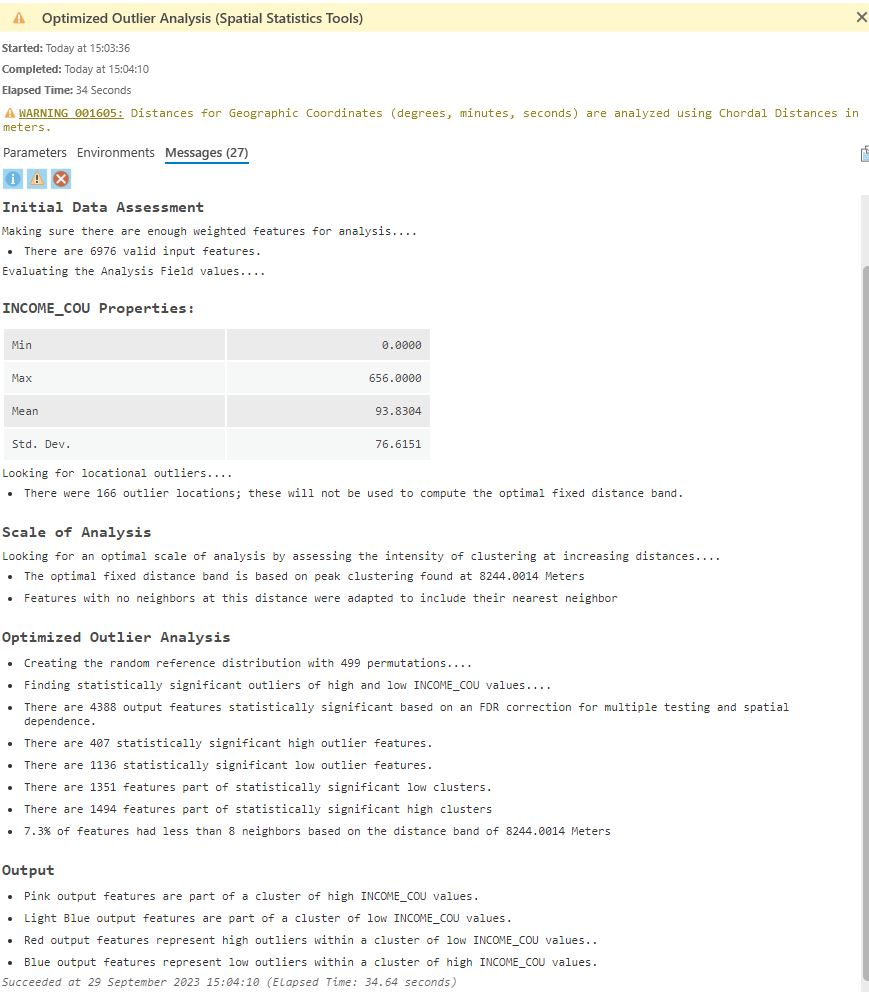

#### Employment Deprived - 2020 - Outlier Analysis

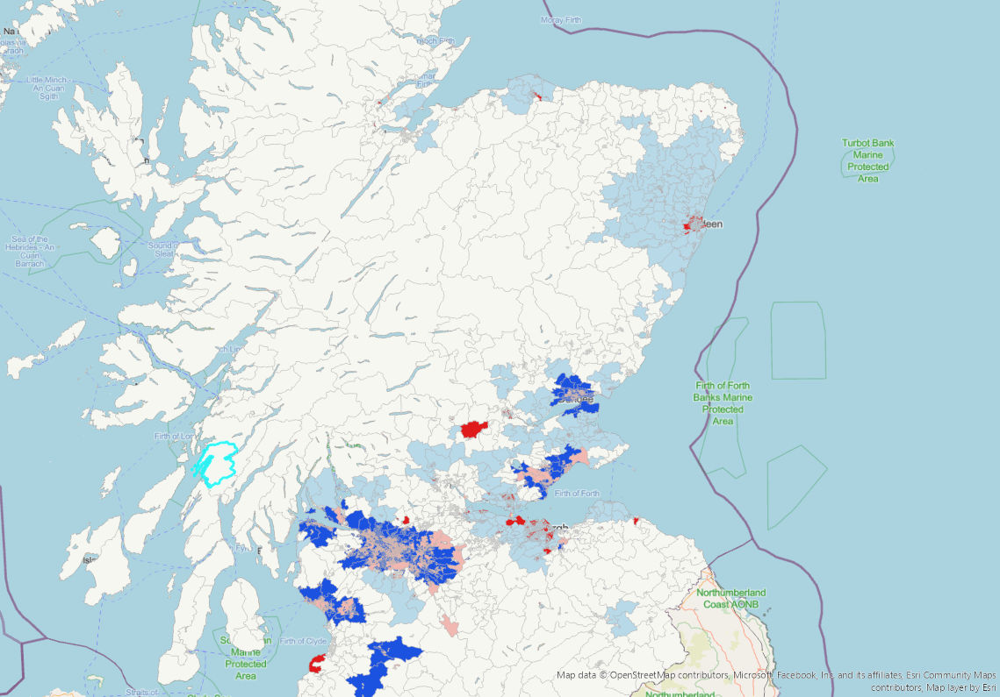

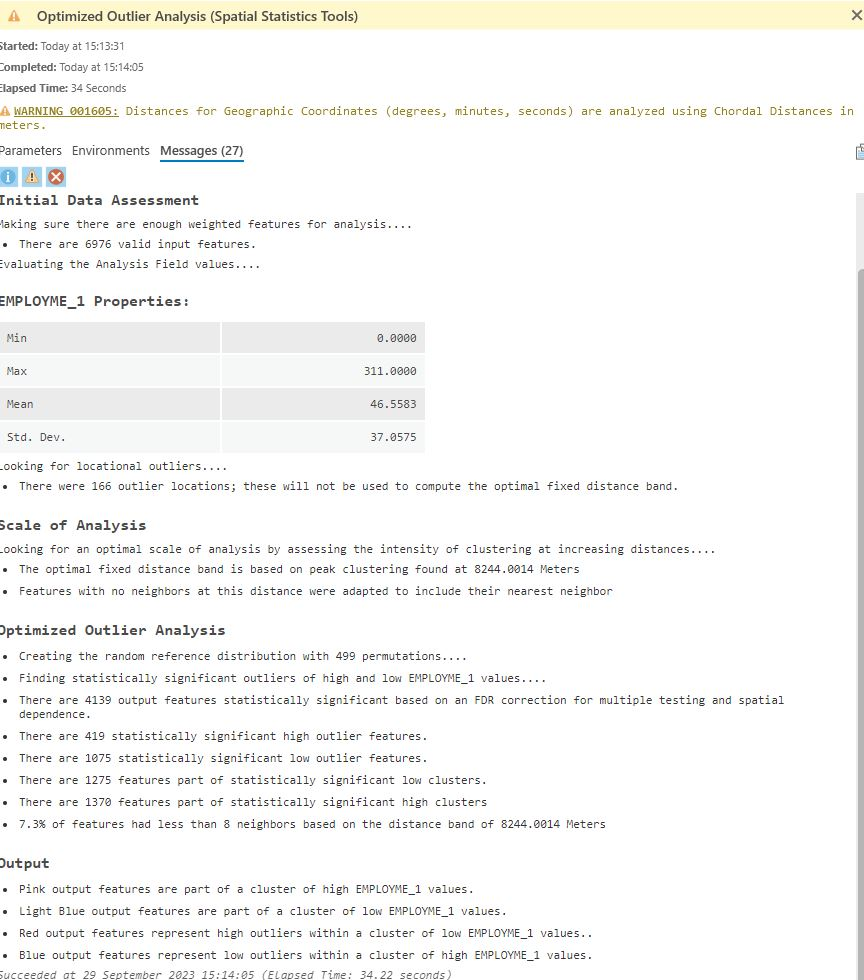

#### Overcrowded - 2020 - Outlier Analysis

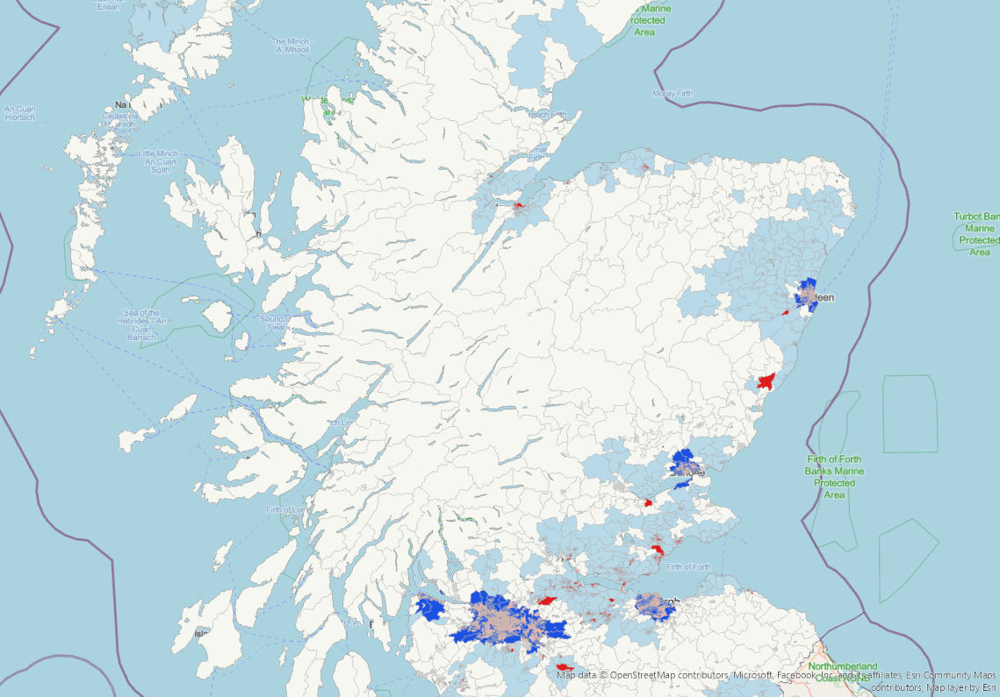

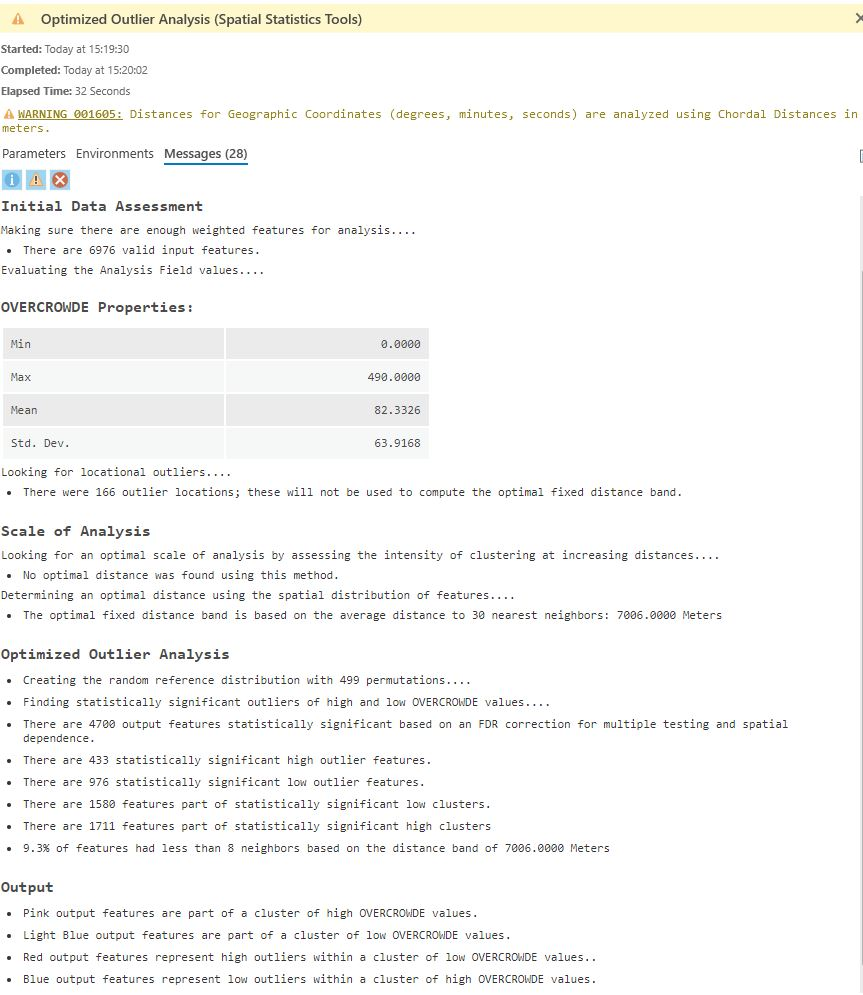

#### Drivetime to GP surgery - 2020 - Outlier Analysis

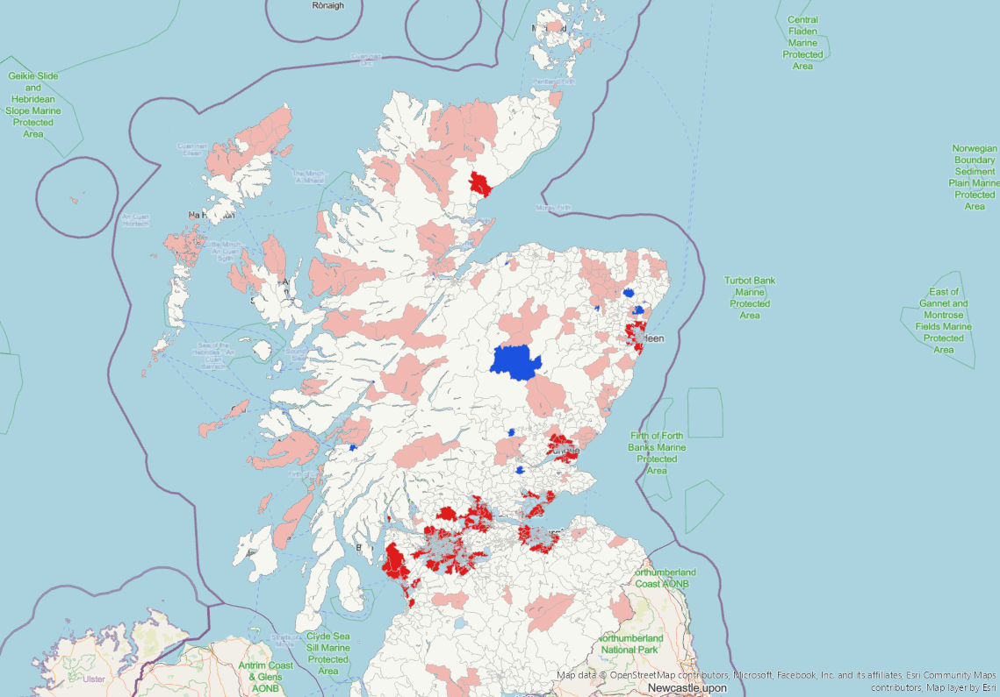

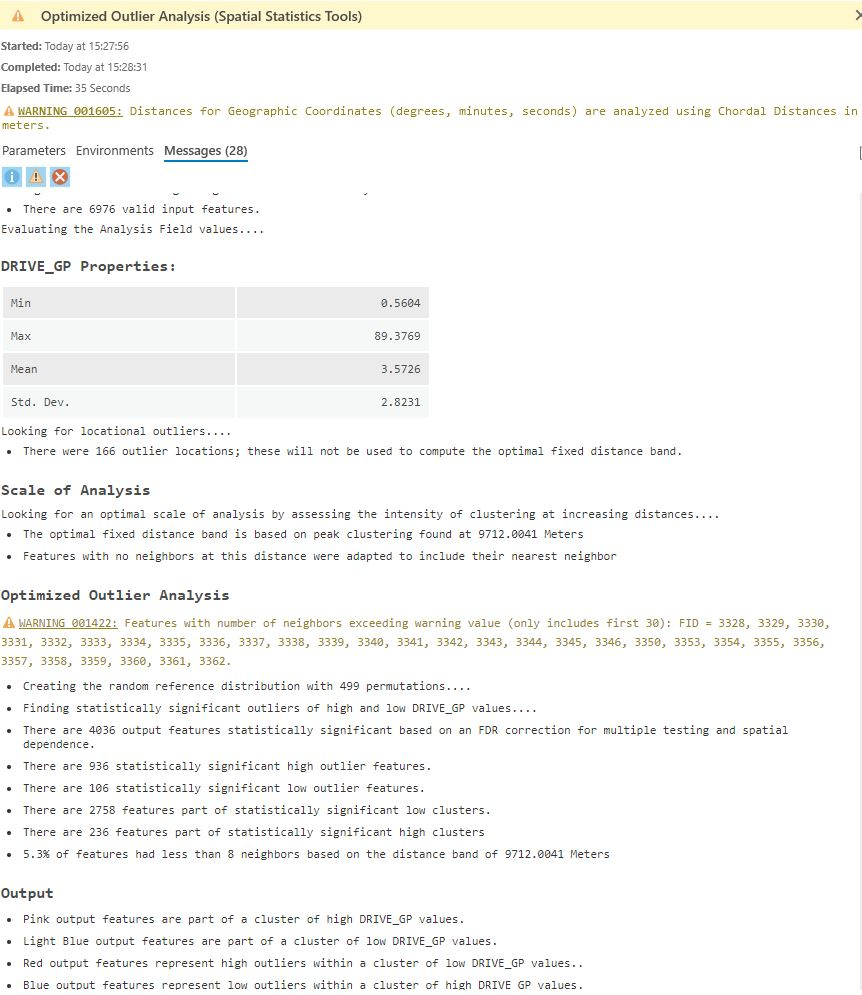

### Conclusion

First and foremost, this project was an opportunity for me to test my data cleansing and analysis skills within a geospatial context, using real data to unveil insights which can be used to help shape future resource planning.  I was also able put my recent QGIS and ArcGIS learning to practical use. It was a challenging, but rewarding project. I now have a better understanding of the data used to calculate the SIMD and the socio-economic geography of my homeland, and was able to visualize the changes in the 2020 index from 2016.

I look forward to the publication of the 2024 index.

Although the Scottish Index of Multiple Deprivation (SMID) is a useful indicator of deprivation levels throughout Scotland, like any index it can only ever be a subjective measure. The choice of domains, indicators and weightings applied, all influence the final outcome and changes to these components could potentiall paint a very different picture. 

In conclusion, like any statistical measure, in order to make an informed decision based on the SMID, it is critical to perform a thorough analysis of the supporting data. 

### Improvements to my analysis

This was a first look at the index and subject to considerable time and resource constraints. Further improvements :

- interactive mapping
- creation of an end-to-end data pipeline
- deeper analysis of sub-domains
- create an alternative index based on different domains/indicators and/or weightings